In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split

from tensorflow.keras import Model

from sklearn.preprocessing import MinMaxScaler

import seaborn as sns
import os
import sys
import pickle

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Get the current working directory (where your notebook is)
current_directory = os.getcwd()

# Construct the full path to your data_utils.py file
analysis_utils_path = '/content/drive/MyDrive/Colab Notebooks/Bachelor Thesis/Thesis Files/analysis_utils.py'  # Replace with the actual path

# Add the directory containing data_utils.py to the Python path
sys.path.append(os.path.dirname(analysis_utils_path))  # Add parent directory of data_utils.py

# Now you can import the custom module
import analysis_utils as au

sys.path = current_directory

In [ ]:
# ONLY FOR RELOAD!

# Reloads if the data_utils has been updated during runtime
# Always need to add and reset the paths
import importlib

# Add the directory containing data_utils.py to the Python path
sys.path.append(os.path.dirname(analysis_utils_path))  # Add parent directory of data_utils.py

importlib.reload(au)  # This reloads the module

sys.path = []

## Loading the data

In [4]:
basePathAnalysis = "/content/drive/MyDrive/Colab Notebooks/Bachelor Thesis/Data/LSTM Analysis Data/"

binaryClassPath = f"{basePathAnalysis}Binary_Models_and_Performances"

In [5]:
# Example usage
train_test_path = f'{binaryClassPath}/deep_analysis_testing_splits_dict.pkl'
tt_splits_dict = au.load_splits_dict(train_test_path)



Splits dictionary loaded from: /content/drive/MyDrive/Colab Notebooks/Bachelor Thesis/Data/LSTM Analysis Data/Binary_Models_and_Performances/deep_analysis_testing_splits_dict.pkl


In [6]:
# Example usage:
analysis_path = f'{binaryClassPath}/LSTM_hidden_data_incl_deep.pkl'
extracted_data_dict = au.load_extracted_data(analysis_path)

Extracted data loaded from: /content/drive/MyDrive/Colab Notebooks/Bachelor Thesis/Data/LSTM Analysis Data/Binary_Models_and_Performances/LSTM_hidden_data_incl_deep.pkl


In [7]:
au.explain_dict_structure(extracted_data_dict)

beta_binary_signal_deep:
   hidden_states_activation:
      Shape: (10, 5, 7500, 16)
   model_predictions:
      Shape: (10, 5, 7500, 1)
   final_hidden_states:
      Shape: (10, 5, 16)
   final_cell_states:
      Shape: (10, 5, 16)
   dense_weights:
      Shape: (16, 1)
   dense_bias:
      Shape: (1,)

beta_binary_signal:
   hidden_states_activation:
      Shape: (10, 5, 7500, 32)
   model_predictions:
      Shape: (10, 5, 7500, 1)
   final_hidden_states:
      Shape: (10, 5, 32)
   final_cell_states:
      Shape: (10, 5, 32)
   dense_weights:
      Shape: (32, 1)
   dense_bias:
      Shape: (1,)

beta_binary_hilbert_only:
   hidden_states_activation:
      Shape: (10, 5, 7500, 32)
   model_predictions:
      Shape: (10, 5, 7500, 1)
   final_hidden_states:
      Shape: (10, 5, 32)
   final_cell_states:
      Shape: (10, 5, 32)
   dense_weights:
      Shape: (32, 1)
   dense_bias:
      Shape: (1,)

beta_binary_wavelet_only:
   hidden_states_activation:
      Shape: (10, 5, 7500, 32)


In [8]:

def add_dimension_to_arrays(data_dict):
  """Adds a new dimension at the beginning of each NumPy array in the dictionary.

  Args:
    data_dict: The dictionary containing NumPy arrays.

  Returns:
    The modified dictionary with the added dimension to each array.
  """
  for key, value in data_dict.items():
    # Check if the value is a dictionary (nested structure)
    if isinstance(value, dict):
      # Recursively call the function for nested dictionaries
      add_dimension_to_arrays(value)
    elif isinstance(value, np.ndarray):
      # Add a new dimension at the beginning using expand_dims
      data_dict[key] = np.expand_dims(value, axis=0)
  return data_dict

# Apply the function to your extracted_data_dict
extracted_data_dict = add_dimension_to_arrays(extracted_data_dict)

In [9]:
print("Structure of the saved dictionary:")
au.explain_dict_structure(extracted_data_dict)

# Example usage
print("Structure of the train/test dictionary:")
au.explain_dict_structure(tt_splits_dict)

Structure of the saved dictionary:
beta_binary_signal_deep:
   hidden_states_activation:
      Shape: (1, 10, 5, 7500, 16)
   model_predictions:
      Shape: (1, 10, 5, 7500, 1)
   final_hidden_states:
      Shape: (1, 10, 5, 16)
   final_cell_states:
      Shape: (1, 10, 5, 16)
   dense_weights:
      Shape: (1, 16, 1)
   dense_bias:
      Shape: (1, 1)

beta_binary_signal:
   hidden_states_activation:
      Shape: (1, 10, 5, 7500, 32)
   model_predictions:
      Shape: (1, 10, 5, 7500, 1)
   final_hidden_states:
      Shape: (1, 10, 5, 32)
   final_cell_states:
      Shape: (1, 10, 5, 32)
   dense_weights:
      Shape: (1, 32, 1)
   dense_bias:
      Shape: (1, 1)

beta_binary_hilbert_only:
   hidden_states_activation:
      Shape: (1, 10, 5, 7500, 32)
   model_predictions:
      Shape: (1, 10, 5, 7500, 1)
   final_hidden_states:
      Shape: (1, 10, 5, 32)
   final_cell_states:
      Shape: (1, 10, 5, 32)
   dense_weights:
      Shape: (1, 32, 1)
   dense_bias:
      Shape: (1, 1)



# Simple Analysis

## Analyze Dense Cell weights

By accessing the final dense layer we can determine which LSTM Cells had the biggest weight, and therefore the biggest influence on the final prediction.

By analyzing the d_weights and d_bias values across epochs or layers, you can gain insights into how the network processes information and adjusts its focus on different features.

### Helper Functions

In [10]:
def rank_by_absolute_value(array):
    """
    Ranks the elements of an array by their absolute values, preserving their original values.
    Also calculates and returns the min, max, median, and mean of the array.

    Args:
        array (np.ndarray): Input 1D NumPy array.

    Returns:
        tuple: (ranked_list, min_val, max_val, median_val, mean_val)
    """
    sorted_indices = np.argsort(np.abs(array))[::-1]
    sorted_by_abs = array[sorted_indices]
    ranked_list = [(rank + 1, index, value) for rank, (index, value) in enumerate(zip(sorted_indices, sorted_by_abs))]

    min_val = np.min(array)
    max_val = np.max(array)
    median_val = np.median(array)
    mean_val = np.mean(array)

    return ranked_list, min_val, max_val, median_val, mean_val

In [11]:
def unrank_weights(ranked_weights, ranked_indices):
    """Unranks a list of ranked weights and indices to their original positions.

    Args:
        ranked_weights (list): The list of ranked weights.
        ranked_indices (list): The list of corresponding ranked indices.
        original_length (int): The original length of the unranked list.

    Returns:
        list: The unranked list of weights.
    """

    unranked_weights = [0] * len(ranked_weights)  # Initialize with zeros

    # Place ranked weights back into their original positions
    for weight, index in zip(ranked_weights, ranked_indices):
        unranked_weights[index] = weight

    return unranked_weights  # Return the unranked list

In [12]:
def rank_dense_weights_for_all_models_multi_summed(extracted_data_dict, epoch=-1, top_n=None, ranked=True):
    """Ranks and displays the dense weights for all models in the extracted
    data dictionary after summing them across dense_cell_id for a specific epoch.

    Args:
        extracted_data_dict (dict): Dictionary containing extracted data from the models.
        epoch (int, optional): The epoch to analyze. Defaults to -1 (last epoch).
        top_n (int, optional): The number of top LSTM cells to display. Defaults to 5.
    Returns:
        dict: A dictionary containing ranked cell indices and weights for each model.
    """
    ranked_weights_dict = {}  # Initialize the dictionary to store results
    for model_name, model_data in extracted_data_dict.items():
        # Dense weights have shape (epoch, hidden_layer_cell_weight, dense_cell_id)
        dense_weights = model_data['dense_weights']

        # Sum weights across dense_cell_id (axis=2) for the specified epoch
        summed_weights_for_epoch = np.sum(dense_weights[epoch], axis=1)

        # Rank summed weights for the specified epoch
        ranked_weights, min_val, max_val, median_val, mean_val = au.rank_by_absolute_value(summed_weights_for_epoch)


         # Extract cell indices and weights
         # This one will keep all cells just in case
        ranked_cell_indices = np.array([item[1] for item in ranked_weights])
        ranked_dense_weights = np.array([item[2] for item in ranked_weights])

        # Store results in the dictionary
        ranked_weights_dict[model_name] = {
            'ranked_cell_indices': ranked_cell_indices,
            'ranked_dense_weights': ranked_dense_weights
        }

        # Create DataFrame (without styling)
        df = pd.DataFrame(ranked_weights, columns=['Rank', 'Cell Index', 'Dense Weight'])
        df = df.set_index('Rank')  # Set 'Rank' as the index

        if top_n:
          # Display only the top_n LSTM cells
          df = df.head(top_n)

        # Display DataFrame with basic formatting
        print(f"\nModel: {model_name} (Epoch {epoch}, Top {top_n} Cells)")
        print(f"Min: {min_val:.4f}, Max: {max_val:.4f}, Median: {median_val:.4f}, Mean: {mean_val:.4f}")
        print(df.to_string())  # Use to_string() for basic formatting
    return ranked_weights_dict

In [13]:
def calculate_weighted_activations(lstm_outputs, dense_weights, dense_bias):
    """Calculates the weighted contributions of LSTM cells to the final output.

    Args:
        lstm_outputs (np.ndarray): The output of the LSTM layer (shape: [lstm_units, timesteps]).
        dense_weights (np.ndarray): The weights of the dense layer (shape: [lstm_units]).
        dense_bias (float): The bias of the dense layer (single float value).

    Returns:
        np.ndarray: The weighted activations of the LSTM cells (shape: [lstm_units, timesteps]).
    """
    # Convert dense_weights to a NumPy array if it's a list
    dense_weights = np.array(dense_weights).T

    # Apply weights and bias to LSTM outputs
    weighted_activations = (lstm_outputs * dense_weights[:, np.newaxis]) + dense_bias

    return weighted_activations  # Return the weighted activations

In [14]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def create_heatmap_from_dense_weights(data_dict, absolute=False):
    """Creates a heatmap from a dictionary of ranked dense weights,
    comparing 5 different models side-by-side.

    Args:
        data_dict (dict): A dictionary where keys represent model names
                          and values are lists of unranked dense weights.
        absolute (bool, optional): Whether to take the absolute value of
                                    the weights before plotting. Defaults to False.

    Returns:
        None: Displays the heatmap.
    """

    # Get model names from the dictionary keys
    model_names = list(data_dict.keys())
    trimmed_model_names = ['_'.join(name.split('_')[-2:]) for name in model_names]


    # Extract cell weights for each model
    cell_weights = [data_dict[model_name] for model_name in model_names]

    # Number of cells
    num_cells = len(cell_weights[0])

    # Create a Pandas DataFrame
    df = pd.DataFrame(cell_weights, index=trimmed_model_names,
                      columns=range(1, num_cells + 1)).T  # Columns labeled 1-32
    df.columns = trimmed_model_names
    df.index.name = "Cell ID"  # Changed to Cell ID

    if absolute:
        df = np.abs(df)

    # Create the heatmap
    plt.figure(figsize=(15, 9))  # Adjust figure size for 5 models
    sns.heatmap(df, annot=True, cmap=sns.color_palette("coolwarm", as_cmap=True),
                fmt=f"=0.2f")
    plt.title('Heatmap of Unranked Dense Weights (Side-by-Side Comparison)')
    plt.xlabel('Model Name')  # Changed to Model Name
    plt.ylabel('Cell ID')  # Changed to Cell ID
    plt.show()

In [15]:
def rank_dense_weights_for_all_models_binary(extracted_data_dict, epoch=-1, output=True, ranked=True, display=True):
    """Ranks and displays the dense weights for all models in the extracted data dictionary.

    Args:
        extracted_data_dict (dict): Dictionary containing extracted data from the models.
        epoch (int, optional): The epoch to analyze. Defaults to -1 (last epoch).
    """
    ranked_weights_dict = {}
    for model_name, model_data in extracted_data_dict.items():
        dense_weights = model_data['dense_weights']

        # Reshape if necessary
        if len(dense_weights.shape) > 2:
            dense_weights = dense_weights.reshape(dense_weights.shape[0], dense_weights.shape[1])

        # Select weights for the specified epoch
        weights_for_epoch = dense_weights[epoch]

        # Rank weights
        ranked_weights, min_val, max_val, median_val, mean_val = rank_by_absolute_value(weights_for_epoch)

        if ranked:
            ranked_weights_dict[model_name] = ranked_weights
        else:
            ranked_weights_dict[model_name] = weights_for_epoch

        # Create DataFrame (without styling)
        df = pd.DataFrame(ranked_weights, columns=['Rank', 'Cell Index', 'Dense Weight'])
        df = df.set_index('Rank')  # Set 'Rank' as the index

        if display:
          # Display DataFrame with basic formatting
          print(f"\nModel: {model_name} (Epoch {epoch})")
          print(f"Min: {min_val:.4f}, Max: {max_val:.4f}, Median: {median_val:.4f}, Mean: {mean_val:.4f}")
          print(df.to_string())  # Use to_string() for basic formatting
    if output:
        return ranked_weights_dict

### Dense Weight executions

In [ ]:
# I am assuming that each of the Dense cells has different top performers
# Each Cell possibly referencing a different frequency range

unranked_weights = rank_dense_weights_for_all_models_binary(extracted_data_dict, ranked=False, display=False)  # Ranks weights for the last epoch

In [ ]:
create_heatmap_from_dense_weights(unranked_weights)

ValueError: 16 columns passed, passed data had 32 columns

This is actually as interesting as I had hoped.

Each dense cell often has very different weights for the different LSTM cells.

Some LSTM Cell seem to be favored by multiple dense cells.

**Next:**

I want to sum the cells weights and see which cell have the most weight overall


In [ ]:
summed_dense_weights_ranked = rank_dense_weights_for_all_models_multi_summed(extracted_data_dict, top_n=10)


Model: beta_binary_hilbert_only (Epoch -1, Top 10 Cells)
Min: -0.6350, Max: 0.5690, Median: 0.2229, Mean: 0.1191
      Cell Index  Dense Weight
Rank                          
1             19     -0.635019
2             22     -0.600180
3              9     -0.580008
4              0      0.569030
5             17      0.547310
6             27      0.540362
7             29     -0.491014
8             12      0.479521
9             31      0.478209
10             5      0.473406

Model: beta_binary_signal (Epoch -1, Top 10 Cells)
Min: -0.7388, Max: 0.7082, Median: 0.1313, Mean: 0.0085
      Cell Index  Dense Weight
Rank                          
1             29     -0.738765
2              0      0.708185
3             13     -0.670190
4              4     -0.670130
5              6      0.642181
6             23     -0.637007
7             30      0.595035
8             10      0.592628
9             15     -0.581150
10             9     -0.553307

Model: beta_binary_all_features (

In [ ]:
au.explain_dict_structure(unranked_weights)

beta_binary_hilbert_only:
   Shape: (32,)
beta_binary_signal:
   Shape: (32,)
beta_binary_all_features:
   Shape: (32,)
beta_binary_wavelet_included:
   Shape: (32,)
beta_binary_hilbert_included:
   Shape: (32,)
beta_binary_wavelet_only:
   Shape: (32,)



Maybe this will be useful later

In [ ]:
def plot_dense_weights_evolution(dense_weights_3d, custom_epochs=None):
    """Plots the evolution of dense weights for each dense cell in a grid.

    Args:
        dense_weights_3d (np.ndarray): A 3-dimensional array of dense weights
                                       with shape (epochs, lstm_units, dense_cells).
        custom_epochs (list, optional): A list of custom epoch values for the x-axis.
                                        If None, the default range is used. Defaults to None.
    """

    num_dense_cells = dense_weights_3d.shape[2]  # Get the number of dense cells

    # Create a grid of subplots
    fig, axes = plt.subplots(1, num_dense_cells, figsize=(15, 6), sharex=True, sharey=True)

    # Determine x-axis values (epochs)
    x_values = custom_epochs if custom_epochs is not None else range(dense_weights_3d.shape[0])

    # Iterate over each dense cell
    for dense_cell_id in range(num_dense_cells):
        dense_weights_cell = dense_weights_3d[:, :, dense_cell_id]  # Select weights for this dense cell

        # Reshape for plotting
        dense_weights_cell = dense_weights_cell.reshape(dense_weights_cell.shape[0], dense_weights_cell.shape[1])

        # Get the current subplot axis
        ax = axes[dense_cell_id]

        # Plot the weights for each LSTM cell within this dense cell
        for lstm_cell_id in range(dense_weights_cell.shape[1]):
            ax.plot(x_values, dense_weights_cell[:, lstm_cell_id],
                    label=f"LSTM Cell {lstm_cell_id + 1}")

        # Add title and labels to the subplot
        ax.set_title(f"Dense Cell {dense_cell_id + 1}")
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Dense Weight")
        ax.set_ylabel("Dense Weight")

    # Add a common legend to the figure, in multiple rows at the bottom
    handles, labels = axes[0].get_legend_handles_labels()  # Get handles and labels from the first subplot
    num_cols = 7  # Number of columns in the legend
    num_rows = int(np.ceil(len(labels) / num_cols))  # Calculate number of rows
    fig.legend(handles, labels, loc='lower center', ncol=num_cols,  # Place legend at the bottom center
               bbox_to_anchor=(0.5, 0.05), fontsize=8)  # Adjust position and font size

    fig.suptitle("Evolution of Dense Weights for Each Dense Cell")
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.3)  # Add more space at the bottom for the legend
    plt.show()

In [ ]:
extracted_data_dict.keys()

dict_keys(['beta_binary_hilbert_only', 'beta_binary_signal', 'beta_binary_all_features', 'beta_binary_wavelet_included', 'beta_binary_hilbert_included', 'beta_binary_wavelet_only'])

TypeError: 'Axes' object is not subscriptable

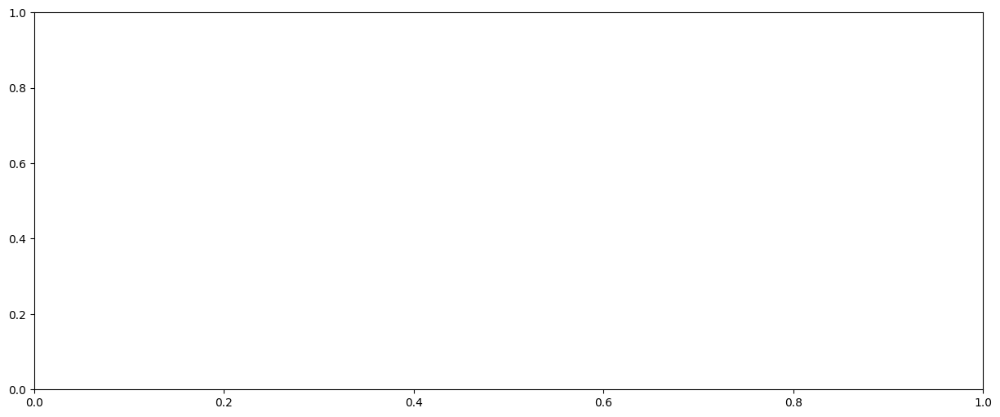

In [ ]:
dense_weights_signal = extracted_data_dict['beta_binary_signal']['dense_weights']
dense_weights_hilbert = extracted_data_dict['beta_binary_hilbert_included']['dense_weights']
dense_weights_feature = extracted_data_dict['beta_binary_wavelet_included']['dense_weights']

custom_epochs = [1,5,10,15,20]

plot_dense_weights_evolution(dense_weights_signal, custom_epochs=custom_epochs)
plot_dense_weights_evolution(dense_weights_hilbert, custom_epochs=custom_epochs)
plot_dense_weights_evolution(dense_weights_feature, custom_epochs=custom_epochs)

This Graph tells us that generally speaking the we have stronger Cell weights than with binary data. It may have to do with the fact, that the higher order predictions try to aim for a higher total value predictions.

Instead of (0 or 1) it must be one of (0,1,2,3,4)

## LSTM Final Cell States

This is actually useless knowledge unless we know how the specific sample ends.

The final cell state is a long-term memory state value but it is still probably only longterm for at most 100 timesteps. Mostlikely, actually less.

Since our sequences are 15000 timesteps it heavily depends on whether a sequence ends on a burst or noise signal, what the final cell state represents

In [ ]:
def plot_specific_cell_state_evolution(cell_states, cell_index=1, custom_epochs=None):
    """Plots the evolution of a specific cell state's value for all samples over epochs.

    Args:
        cell_states (np.ndarray): The final cell states of the LSTM (shape: [epochs, samples, cell states]).
        cell_index (int, optional): The index of the cell state to plot. Defaults to 1.
        custom_epochs (list, optional): A list of custom epoch values for the x-axis. If None, the default range is used. Defaults to None.
    """

    specific_cell = cell_states[:, :, cell_index]
    x_values = custom_epochs if custom_epochs is not None else range(cell_states.shape[0])

    plt.figure(figsize=(12, 6))
    for i in range(specific_cell.shape[1]):  # Iterate over samples
        plt.plot(x_values, specific_cell[:, i], label=f"Sample {i+1}")

    plt.title(f"Evolution of Cell {cell_index + 1} State Value per Sample over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Cell State Value")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.tight_layout()
    plt.show()


def plot_mean_cell_state_evolution(cell_states, custom_epochs=None):
    """Plots the evolution of the mean cell states over epochs.

    Args:
        cell_states (np.ndarray): The final cell states of the LSTM (shape: [epochs, samples, cell states]).
        custom_epochs (list, optional): A list of custom epoch values for the x-axis. If None, the default range is used. Defaults to None.
    """

    mean_states = np.mean(cell_states, axis=1)  # Mean across samples
    x_values = custom_epochs if custom_epochs is not None else range(cell_states.shape[0])

    plt.figure(figsize=(12, 6))
    for i in range(mean_states.shape[1]):  # Iterate over cell states
        plt.plot(x_values, mean_states[:, i], label=f"Cell State {i+1}")

    plt.title("Evolution of Mean Cell States over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Mean Cell State Value")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.tight_layout()
    plt.show()

def visualize_lstm_cell_states(cell_states, custom_epochs=None):
    """
    Visualizes the evolution of LSTM cell states over epochs.

    Args:
        cell_states (np.ndarray): The LSTM cell states with shape (epochs, samples, num_cells).
        custom_epochs (list or np.ndarray, optional): A list or array of custom epoch values
                                                      to use for the x-axis. If None, the default
                                                      range of epochs is used. Defaults to None.
    """
    epochs, samples, num_cells = cell_states.shape

    # Create a grid of subplots
    n_rows = int(np.ceil(np.sqrt(num_cells)))
    n_cols = n_rows
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
    axes = axes.flatten()

    # Determine x-axis values
    x_values = custom_epochs if custom_epochs is not None else range(epochs)

    # Loop through each cell and plot its statistics
    for cell_index in range(num_cells):
        chosen_cell = cell_states[:, :, cell_index]

        # Compute statistics
        mean_cell = np.mean(chosen_cell, axis=1)
        variance_cell = np.var(chosen_cell, axis=1)
        min_cell = np.min(chosen_cell, axis=1)
        max_cell = np.max(chosen_cell, axis=1)

        # Plot on the respective subplot using x_values
        ax = axes[cell_index]
        ax.plot(x_values, mean_cell, label="Mean", color="blue")
        ax.fill_between(
            x_values,  # Use x_values here
            mean_cell - variance_cell,
            mean_cell + variance_cell,
            color="blue",
            alpha=0.2,
            label="Variance"
        )
        ax.plot(x_values, min_cell, label="Min", color="green", linestyle="--")  # Use x_values here
        ax.plot(x_values, max_cell, label="Max", color="red", linestyle="--")  # Use x_values here

        # Add title and format
        ax.set_title(f"Cell {cell_index + 1}")
        ax.set_xlabel("Epoch")
        ax.set_ylabel("Cell State Value")

    # Remove extra subplots if any
    for i in range(num_cells, len(axes)):
        fig.delaxes(axes[i])

    # Add legend for the first plot only
    axes[0].legend(loc="upper right", fontsize=8)

    fig.suptitle("The final LSTM Cell States after each sample runthrough at each epoch in training")
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

In [ ]:
cell_states_signal = extracted_data_dict['mid_noise_beta_binary_signal']['final_cell_states']
cell_states_features = extracted_data_dict['mid_noise_beta_binary_hibert_included']['final_cell_states']

# Assuming 'cell_states_low' is your cell states data
plot_specific_cell_state_evolution(cell_states_signal,   cell_index=2, custom_epochs=custom_epochs)  # Plot cell state 3 with custom epochs
plot_specific_cell_state_evolution(cell_states_features, cell_index=2, custom_epochs=custom_epochs)  # Plot cell state 3 with custom epochs


Output hidden; open in https://colab.research.google.com to view.

This is actually useless knowledge unless we know how the specific sample ends

In [ ]:
visualize_lstm_cell_states(cell_states_signal, custom_epochs=custom_epochs)
visualize_lstm_cell_states(cell_states_features, custom_epochs=custom_epochs)

ValueError: too many values to unpack (expected 3)

A high variance, indicated in the blue shade, may indicate a greater suceptability to changes in the signal. That is a very far indication, however.

Also, somehow the variance is often much greater than the min, max values. That is strange

## LSTM Hidden Activation (without weights)

I still attempt to display the highes ranked LSTM weights

### Helper Functions

In [59]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors

def visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, sample_signal, directory_name='low_noise_beta_binary',
                                sample_number=4, top_n=4, epoch_to_visualize=-1, time_limit=(0,5),
                                noise_ratio=2,
                                weighted_cells=False, sequence_duration=None,
                                show_worst_cells=True, cells_to_visualize=None,
                                feature_labels=None):
  """Visualizes the hidden activation of an LSTM model for a specific sample.
     Requirements!  Needs at least one

Args:
        extracted_data_dict (dict): Dictionary containing extracted data from the model, including hidden states and predictions.
        tt_splits_dict (dict): Dictionary containing train-test splits, including X_test and y_test.
        sample_signal (np.ndarray): The input signal for the sample. For visualiztion. Needs same shape as X_test.
        directory_name (str, optional): The noise level of the data to visualize ('low_noise_beta_binary' or 'high_noise_beta_binary'). Defaults to 'low_noise_beta_binary'.
        sample_number (int, optional): The index of the sample to visualize. Defaults to 4.
        top_n (int, optional): The number of top and bottom LSTM cells to highlight based on their weights. Defaults to 4.
        epoch_to_visualize (int, optional): The epoch to visualize the hidden states from. Defaults to 7.
        time_limit (tuple, optional): The time range to display on the x-axis (in seconds). Defaults to (55, 60).
        weighted_cells (bool, optional): Whether to display the weighted cell activations. Defaults to False.
        sequence_duration (int, optional): The duration of the input sequence in seconds. If None, it will be inferred from the signal length. Defaults to None.
        show_worst_cells (bool, optional): Whether to display the worst performing LSTM cells. Defaults to True.


  Returns:
    None: Displays the visualization using matplotlib.
  """
  label_size = 14
  tick_size = 14
  legen_size = 10

  # Create custom color lists with variations of green and red
  top_colors = [mcolors.to_rgba('green', alpha=1 - (i / (top_n + 1))) for i in range(top_n)] # More intense green, less alpha variation
  bottom_colors = [mcolors.to_rgba('red', alpha=1 - (i / (top_n + 1))) for i in range(top_n)] # More intense red, less alpha variation

  # Extract data for the specified noise level
  X_test = tt_splits_dict[directory_name]['X_test'] # Gets only the signal (works for featue Xs as well)
  y_test = tt_splits_dict[directory_name]['y_test']
  hidden_states_activation = extracted_data_dict[directory_name]['hidden_states_activation']
  dense_weights = extracted_data_dict[directory_name]['dense_weights'][epoch_to_visualize, : ,0]
  dense_bias = extracted_data_dict[directory_name]['dense_bias'][epoch_to_visualize]
  epoch_model_predictions = extracted_data_dict[directory_name]['model_predictions']

  # Extract signal and ground truth for the sample
  # Get number of samples, sequence length, and features
  num_samples, n_noise_ratios, seq_len, num_features = X_test.shape

  # Signal sample comes in as already finished shape
  signal_sample = sample_signal.flatten()
  ground_truth = y_test[sample_number, noise_ratio].flatten()

  if len(signal_sample) != len(ground_truth):
    raise ValueError(f"Sample signal and ground truth must have the same length. You might need a different reference signal array. \nSignal Sample: {len(signal_sample)} \nGround Truth: {len(ground_truth)}")

  # Define time vector based on sequence_duration
  sampling_frequency = 250  # Hz
  if sequence_duration is None:  # If sequence_duration is not provided, infer it from the signal length
      sequence_duration = len(ground_truth) / sampling_frequency
  time_vec = np.linspace(0, sequence_duration, int(sequence_duration * sampling_frequency), endpoint=False)  # Ensure time_vec length matches signal length

    # Create visualization with potential extra subplot for weighted cells and features
  num_subplots = 2 + int(weighted_cells)  # Start with 3 subplots (signal, prediction, hidden states)
  if num_features > 1:
      num_subplots += 1  # Add a subplot for features if num_features > 1
  fig, ax = plt.subplots(num_subplots, 1, figsize=(20, 12 + 6 * int(weighted_cells)),
                         sharex=True, gridspec_kw={'hspace': 0.3})

  noise_ratios = [-8,-4,0,4,8]

  # Get top and bottom LSTM cell IDs based on weights (only if cells_to_visualize is None)
  if cells_to_visualize is None:
      final_weights, _, _, _, _ = au.rank_by_absolute_value(dense_weights)
      cell_ids_good = [item[1] for item in final_weights[:top_n]]
      cell_ids_bad = [item[1] for item in final_weights[-top_n:]]

      print(f"Model: {directory_name} \nSample: {sample_number}")
      print(f'Number of Features: {num_features}')
      print(f"Noise Ratios: {noise_ratios[noise_ratio]}")
      print(f"Top {top_n} LSTM Cells: {cell_ids_good}")
      print(f"Bottom {top_n} LSTM Cells: {cell_ids_bad}")
  else:
      cell_ids_good = cells_to_visualize  # Use provided cells if given
      cell_ids_bad = []  # Don't show worst cells if specific cells are provided
      print(f"Model: {directory_name} \nSample: {sample_number}")
      print(f'Number of Features: {num_features}')
      print(f"Noise Ratios: {noise_ratios[noise_ratio]}")
      print(f"Visualizing Cells: {cell_ids_good}")

  # Extract hidden states for the specified epoch
  epoch_lstm_act = hidden_states_activation[epoch_to_visualize]
  model_pred = epoch_model_predictions[epoch_to_visualize]
  model_pred_binary = np.rint(model_pred).astype(int)

  # Plot LFP signal and prediction on the same axis (ax[0])
  ax[0].plot(time_vec, signal_sample, label='Signal', alpha=1, color="black")
  ax[0].set_xlabel("Time (s)", fontsize=label_size)
  ax[0].set_ylabel("Signal Amplitude", fontsize=label_size)
  ax[0].set_title(f"Artificial Signal (Sample: {sample_number}); Noise Ratio: {noise_ratios[noise_ratio]}dB", fontsize=label_size)
  ax[0].set_xlim(time_limit)
  ax[0].set_ylim((-4,4))
  ax[0].tick_params(axis='both', which='major', labelsize=tick_size)


  # Create a second y-axis for prediction
  ax2 = ax[0].twinx()  # instantiate a second axes that shares the same x-axis
  predictions = model_pred[sample_number, noise_ratio].flatten()
  ax2.plot(time_vec, predictions, label='Confidence', alpha=0.9, color='blue') # plot prediction on ax2
  ax2.stackplot(time_vec, ground_truth, labels=["Ground Truth"], alpha=0.25, colors=['red'])  # plot ground truth on ax2
  ax2.axhline(y=0.5, color='red', linestyle='-', linewidth=1, label='Threshold')
  ax2.set_ylabel("Prediction Confidence", fontsize=label_size) # set ylabel for ax2
  ax2.set_ylim(0, 1)  # set ylim for ax2
  ax2.tick_params(axis='y', labelsize=tick_size)  # set tick label fontsize for ax2

    # Get legend handles and labels from both axes
  handles1, labels1 = ax[0].get_legend_handles_labels()
  handles2, labels2 = ax2.get_legend_handles_labels()

  # Combine handles and labels
  handles = handles1 + handles2
  labels = labels1 + labels2

  # Create a combined legend
  ax[0].legend(handles, labels, loc='upper left', fontsize=legen_size)



  subplot_index = 1  # Initialize subplot index
  predictions = model_pred[sample_number, noise_ratio].flatten()
  # ax[subplot_index].plot(time_vec, predictions, label='Confidence', alpha=0.9)
  # ax[subplot_index].stackplot(time_vec, ground_truth, labels=["Ground Truth"], alpha=0.7, colors=['lightblue'])
  # ax[subplot_index].axhline(y=0.5, color='red', linestyle='-', linewidth=1, label='Threshold')
  # ax[subplot_index].set_xlabel("Time (s)")  # Remove fontsize from xlabel
  # ax[subplot_index].set_ylabel("Prediction Confidence")  # Remove fontsize from ylabel
  # ax[subplot_index].set_title("Predicted Signal Type")
  # ax[subplot_index].legend(loc='lower right', fontsize=legen_size) # Add legend to second subplot
  # ax[subplot_index].set_xlim(time_limit)
  # ax[subplot_index].set_ylim(0, 1)
  # ax[subplot_index].tick_params(axis='both', which='major', labelsize=label_size)  # Set tick label fontsize
  # Increment subplot index
  subplot_index = 1

  # Plot Input Features (Conditionally)

  print(num_features, X_test.shape)
  if num_features > 1:
      if feature_labels is None:
          print(num_features)
          feature_labels = [f'Feature {i}' for i in range(1, num_features + 1)]
      print(feature_labels)
      for feature_idx in range(1, num_features):
          ax[subplot_index].plot(time_vec, X_test[sample_number, noise_ratio, :, feature_idx], alpha=0.7, label=feature_labels[feature_idx])
          ax[subplot_index].set_title(f"Features", fontsize=label_size)

      ax[subplot_index].set_xlabel("Time (s)", fontsize=label_size)  # Set xlabel fontsize
      ax[subplot_index].set_ylabel("Feature Amplitude", fontsize=label_size)  # Set ylabel fontsize (add this line)
      ax[subplot_index].legend(loc='upper left', fontsize=legen_size) # Add legend to features subplot
      ax[subplot_index].set_xlim(time_limit)
      ax[subplot_index].tick_params(axis='both', which='major', labelsize=tick_size)  # Set tick label fontsize
      subplot_index += 1  # Increment subplot index if features were plotted




  # Plot hidden states for top and bottom cells (or specified cells)
  for i, cell_id in enumerate(cell_ids_good):
      ax[subplot_index].plot(time_vec, epoch_lstm_act[sample_number, noise_ratio, :, cell_id], label=f'Cell {cell_id + 1}')

  if show_worst_cells and cells_to_visualize is None:  # Only plot worst cells if show_worst_cells is True and cells_to_visualize is None
      for i, cell_id in enumerate(cell_ids_bad):
          ax[subplot_index].plot(time_vec, epoch_lstm_act[sample_number, noise_ratio, :, cell_id], label=f'Cell {cell_id + 1}', color=bottom_colors[-i])


  ax[subplot_index].set_title(f'LSTM Hidden State Values', fontsize=label_size)
  ax[subplot_index].set_xlabel('Time (s)', fontsize=label_size)
  ax[subplot_index].set_ylabel('Hidden State Value', fontsize=label_size)
  ax[subplot_index].set_xlim(time_limit)
  ax[subplot_index].legend(loc='upper left', fontsize=legen_size) # Add legend to hidden states subplot
  ax[subplot_index].tick_params(axis='both', which='major', labelsize=tick_size)  # Set tick label fontsize
  subplot_index += 1  # Increment subplot index

  # Plot weighted cell states if weighted_cells is True (added as a separate subplot below hidden states)
  if weighted_cells:
      hidden_act = epoch_lstm_act[sample_number, noise_ratio].T
      # It wants data shape of [lstm_units, timesteps]
      weighted_activations = calculate_weighted_activations(hidden_act, dense_weights, dense_bias)

      # Plot weighted activations for top and bottom cells (or specified cells)
      for i, cell_id in enumerate(cell_ids_good):
          ax[subplot_index].plot(time_vec, weighted_activations[cell_id], label=f'Cell {cell_id + 1}')

      if show_worst_cells and cells_to_visualize is None:  # Only plot worst cells if show_worst_cells is True and cells_to_visualize is None
          for i, cell_id in enumerate(cell_ids_bad):
              ax[subplot_index].plot(time_vec, weighted_activations[cell_id], label=f'Cell {cell_id + 1}', color="red")

      ax[subplot_index].set_title(f'LSTM Weighted Hidden State Values', fontsize=label_size)
      ax[subplot_index].set_xlabel('Time (s)', fontsize=label_size)
      ax[subplot_index].set_ylabel('Hidden State Value \n (Weighted)', fontsize=label_size)
      ax[subplot_index].set_xlim(time_limit)
      ax[subplot_index].legend(loc='upper left', fontsize=legen_size) # Add legend to weighted hidden states subplot
      ax[subplot_index].tick_params(axis='both', which='major', labelsize=tick_size)  # Set tick label fontsize

  for axis in ax:
    axis.grid(False)  # Disable x-grid lines for this subplot
    axis.tick_params(axis='both', which='both',  # Apply to both x and y axes
                        bottom=True, top=False,   # Control tick visibility
                        left=True, right=False,
                        labelbottom=True, labelleft=True) # Control tick label visibility
  plt.show()

In [17]:
def calculate_weighted_activations(lstm_outputs, dense_weights, dense_bias):
    """Calculates the weighted contributions of LSTM cells to the final output.

    Args:
        lstm_outputs (np.ndarray): The output of the LSTM layer (shape: [lstm_units, timesteps]).
        dense_weights (np.ndarray): The weights of the dense layer (shape: [lstm_units]).
        dense_bias (float): The bias of the dense layer (single float value).

    Returns:
        np.ndarray: The weighted activations of the LSTM cells (shape: [lstm_units, timesteps]).
    """
    # Convert dense_weights to a NumPy array if it's a list
    dense_weights = np.array(dense_weights).T

    # Apply weights and bias to LSTM outputs
    weighted_activations = (lstm_outputs * dense_weights[:, np.newaxis]) + dense_bias

    return weighted_activations  # Return the weighted activations

In [18]:
def unrank_weights(ranked_weights, ranked_indices):
    """Unranks a list of ranked weights and indices to their original positions.

    Args:
        ranked_weights (list): The list of ranked weights.
        ranked_indices (list): The list of corresponding ranked indices.
        original_length (int): The original length of the unranked list.

    Returns:
        list: The unranked list of weights.
    """

    unranked_weights = [0] * len(ranked_weights)  # Initialize with zeros

    # Place ranked weights back into their original positions
    for weight, index in zip(ranked_weights, ranked_indices):
        unranked_weights[index] = weight

    return unranked_weights  # Return the unranked list

### Viusalizations

In [ ]:
extracted_data_dict.keys()

dict_keys(['beta_binary_signal_deep', 'beta_binary_signal', 'beta_binary_hilbert_only', 'beta_binary_wavelet_only', 'beta_binary_hilbert_included', 'beta_binary_wavelet_included', 'beta_binary_all_features'])

In [ ]:
tt_splits_dict['beta_binary_hilbert_included']['X_test'].shape

(10, 5, 7500, 2)

Model: beta_binary_signal_deep 
Sample: 2
Number of Features: 1
Noise Ratios: 0
Top 3 LSTM Cells: [np.int64(2), np.int64(14), np.int64(13)]
Bottom 3 LSTM Cells: [np.int64(3), np.int64(11), np.int64(1)]
1 (10, 5, 7500, 1)


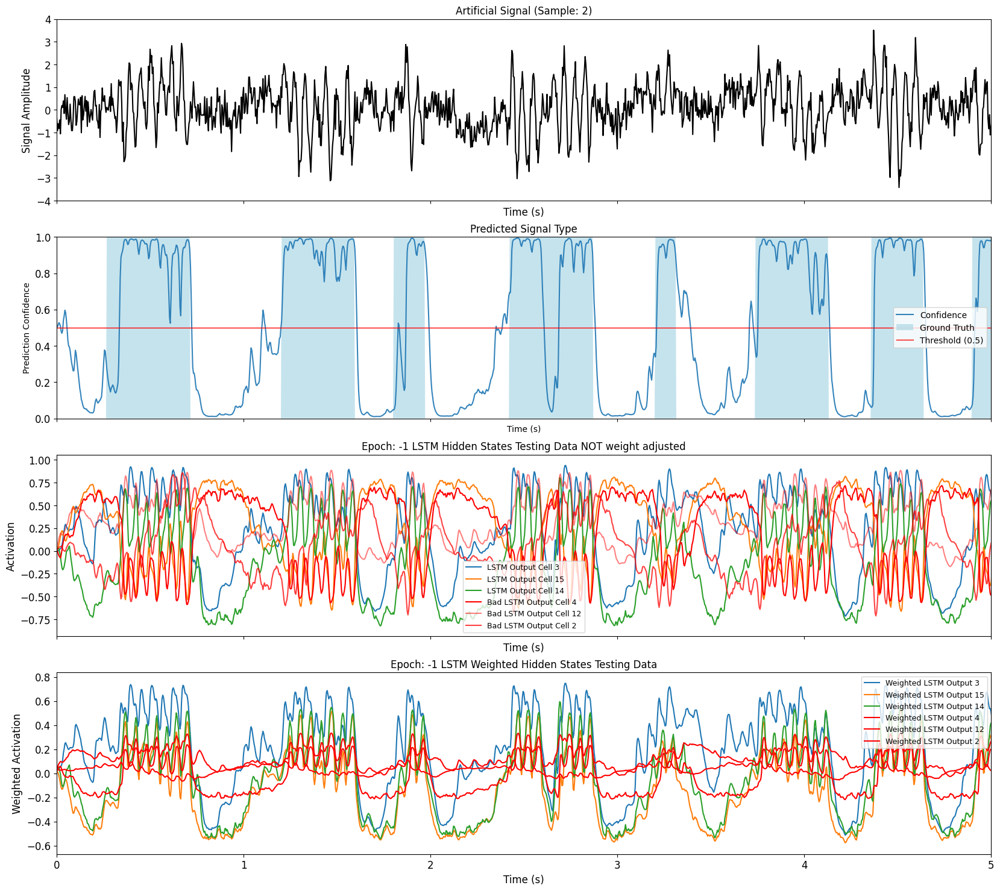

In [ ]:
selected_directory = 'beta_binary_signal_deep'

sample = 2
epoch = -1
noise_ratio = 2
cells_to_visualize = [0,1,2,3]

signal_only = tt_splits_dict['beta_binary_signal']['X_test'][sample, noise_ratio, : , 0]

# Mit Weights!
visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, signal_only, directory_name=selected_directory,
                                      sample_number=sample, epoch_to_visualize=epoch,
                                      top_n=3,
                                      weighted_cells=True,
                                      show_worst_cells=True,
                                      noise_ratio=noise_ratio,
                                      feature_labels=["Signal", "Hilbert Amplitude"]
                                      #cells_to_visualize=cells_to_visualize,

                                      )


### Analyze specifc cells

Now we'll look into certain specific cells.

1. Choosing an allrounder Cell

    a. Feature Model

    b. Signal Model
2. Choosing a specific Cell

    a. Feature Model

    b. Signal Model

In [ ]:
summed_dense_weights_ranked.keys()

dict_keys(['beta_binary_hilbert_only', 'beta_binary_signal', 'beta_binary_all_features', 'beta_binary_wavelet_included', 'beta_binary_hilbert_included', 'beta_binary_wavelet_only'])

**1. Choosing an allrounder**

In [ ]:
summed_weights_signal = summed_dense_weights_ranked['beta_binary_signal']["ranked_cell_indices"][:3]
summed_weights_features = summed_dense_weights_ranked['beta_binary_all_features']["ranked_cell_indices"][:3]
print(summed_weights_signal)
print(summed_weights_features)

[29  0 13]
[12 21  2]


**1a) Feature Model**

In [ ]:
sample_id = 2
# Zum export (theta,alpha,beta,gamma)
for noise_ratio in range(5):
    signal_only = tt_splits_dict['beta_binary_signal']['X_test'][sample_id, noise_ratio, : , 0]

    visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, signal_only, directory_name='beta_binary_wavelet_only',
                                      sample_number=sample_id, epoch_to_visualize=-1,
                                      noise_ratio=noise_ratio,
                                      cells_to_visualize=summed_weights_features)

Output hidden; open in https://colab.research.google.com to view.

Das sind zwar die allrounder unter den Zellen, aber man sieht ganz klar, welche für was am besten sind.

**1b) Signal Model**

In [ ]:
sample_id = 2
# Zum export (theta,alpha,beta,gamma)
for noise_ratio in range(5):
    signal_only = tt_splits_dict['beta_binary_signal']['X_test'][sample_id, noise_ratio, : , 0]

    visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, signal_only, directory_name='beta_binary_signal',
                                      sample_number=sample_id, epoch_to_visualize=-1,
                                      noise_ratio=noise_ratio,
                                      cells_to_visualize=summed_weights_signal)

Output hidden; open in https://colab.research.google.com to view.

**2) Specific Cell**

Features Model:

Cell_ID=11 (strong gamma correlation)

Cell_ID=12 (strong alpha correlation)

Cell_ID=4 (theta corr)

Signal Model:

Cell_ID=13 (strong noise correlation)

Cell_ID=6 (theta correlation)

None of these cells are in the top 10 overall.

I got those conclusions from the dense weights shown at the top of the file.


**2a) Feature Model**

Model: mid_noise_features_multi_mid 
Sample: 2


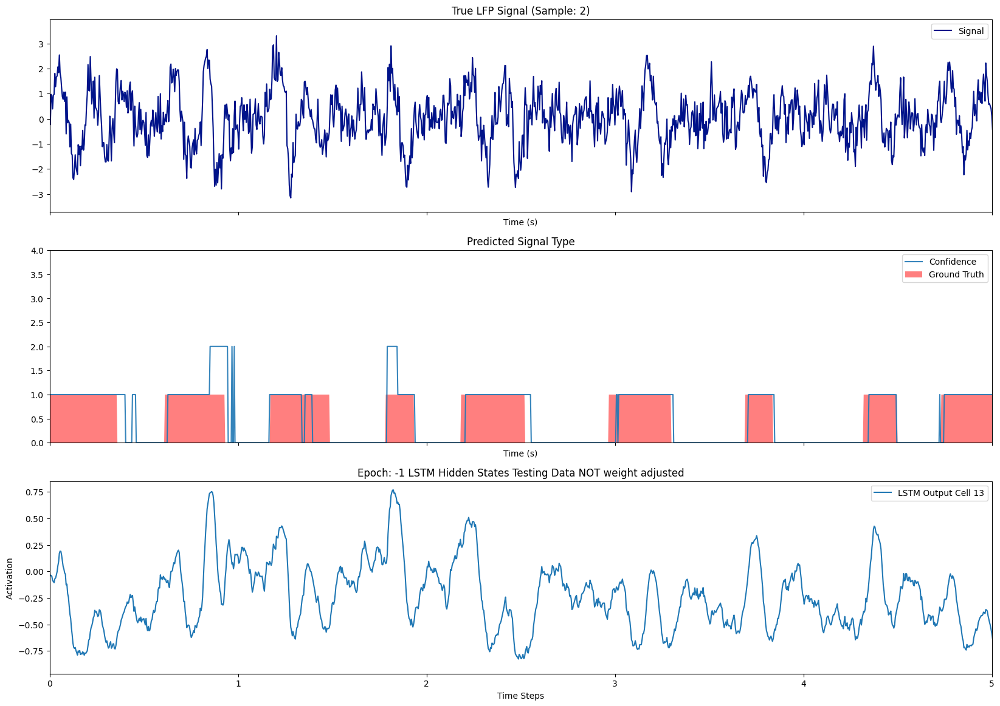

Model: mid_noise_features_multi_mid 
Sample: 6


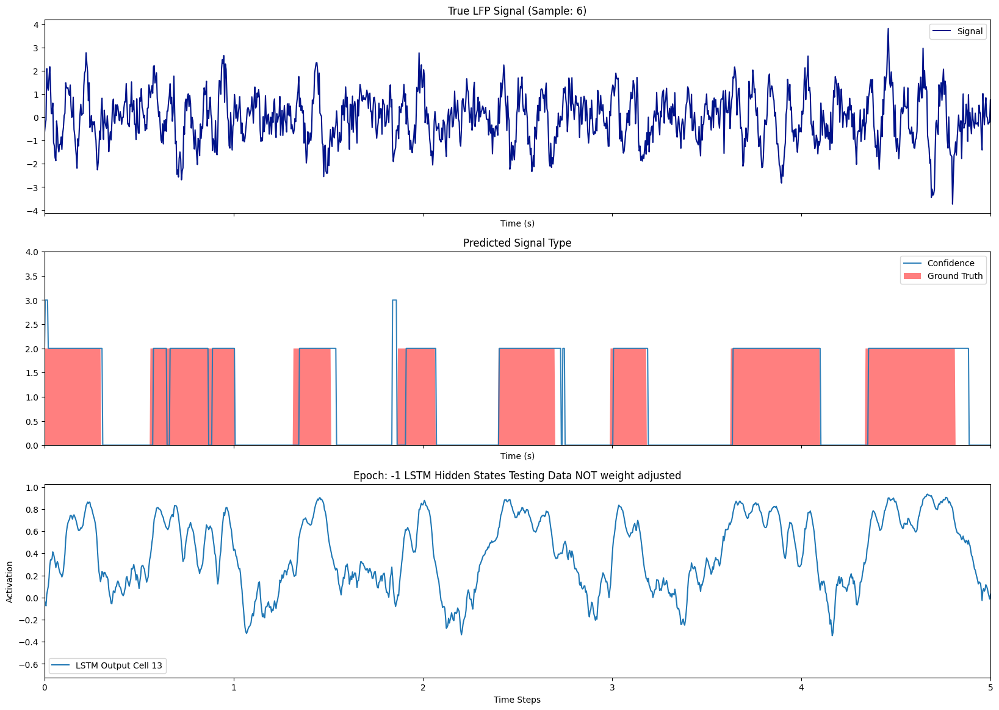

Model: mid_noise_features_multi_mid 
Sample: 10


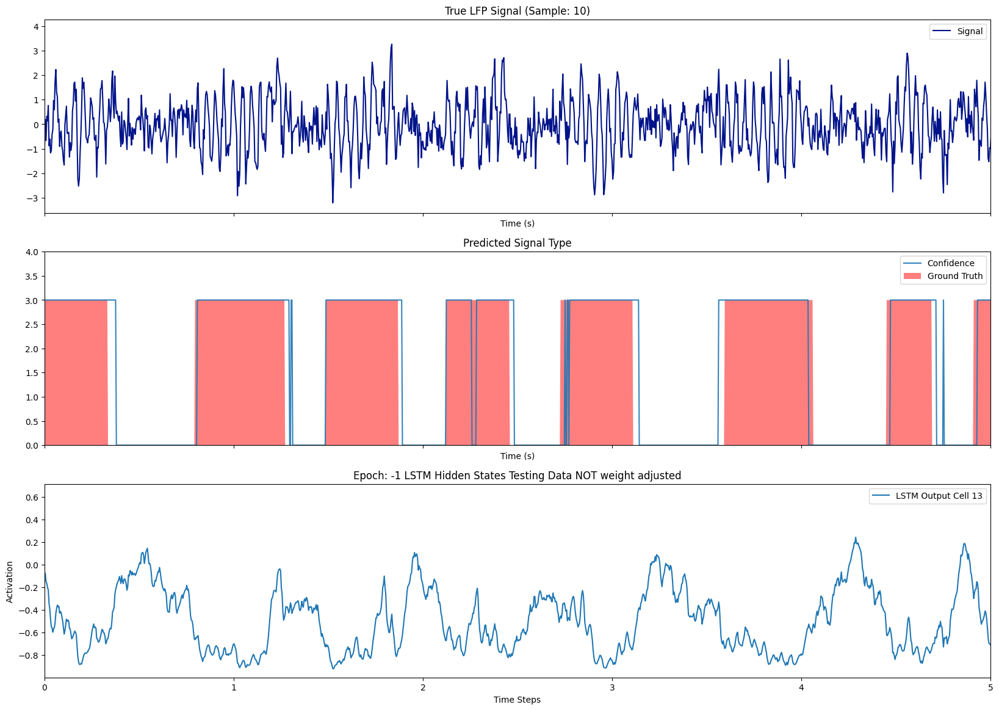

Model: mid_noise_features_multi_mid 
Sample: 14


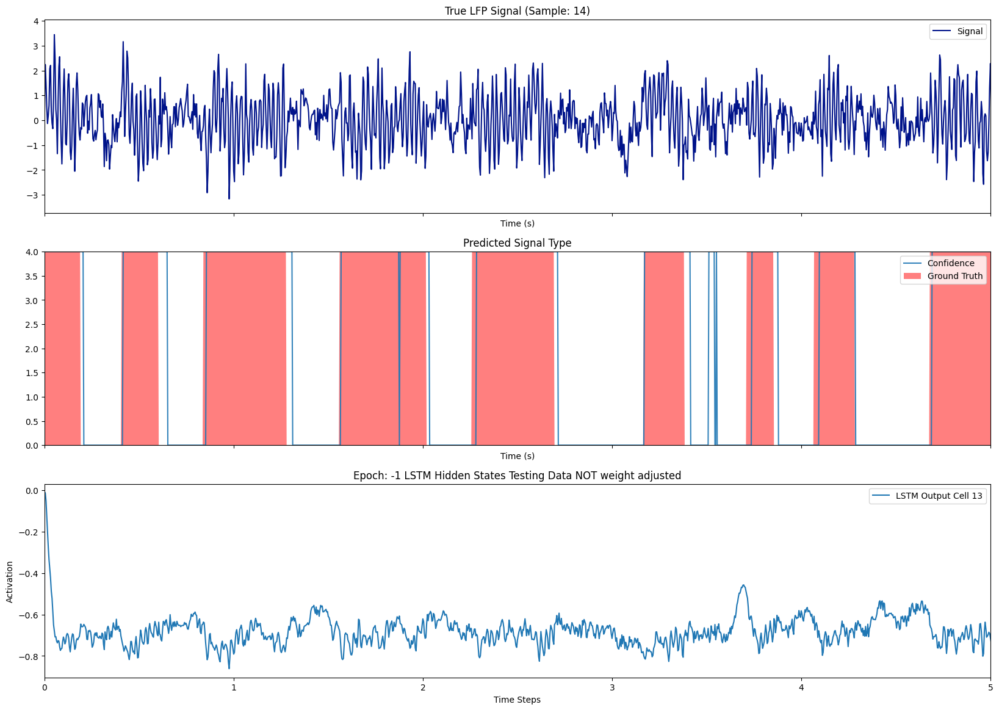

In [ ]:
special_cells = [12] # strong alpha

# Zum export (theta,alpha,beta,gamma)
for sample in [2,6,10,14]:
    visualize_hidden_activation_multi(extracted_data_dict, tt_splits_dict, directory_name='mid_noise_features_multi_mid',
                                      sample_number=sample, epoch_to_visualize=-1,
                                      cells_to_visualize=special_cells)

Model: mid_noise_features_multi_mid 
Sample: 2


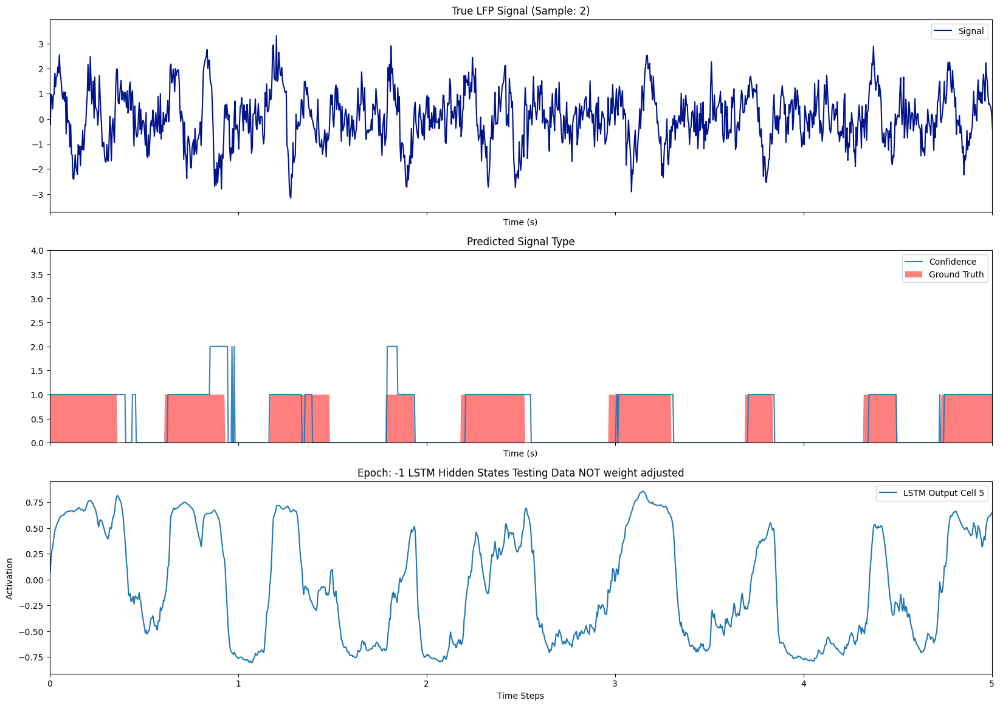

Model: mid_noise_features_multi_mid 
Sample: 6


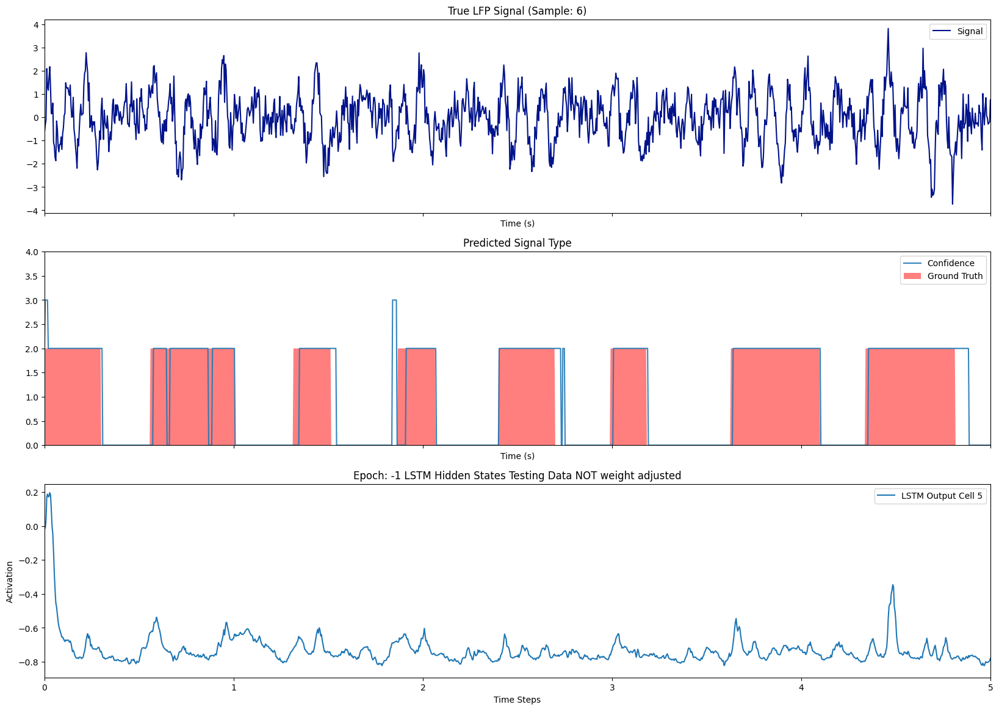

Model: mid_noise_features_multi_mid 
Sample: 10


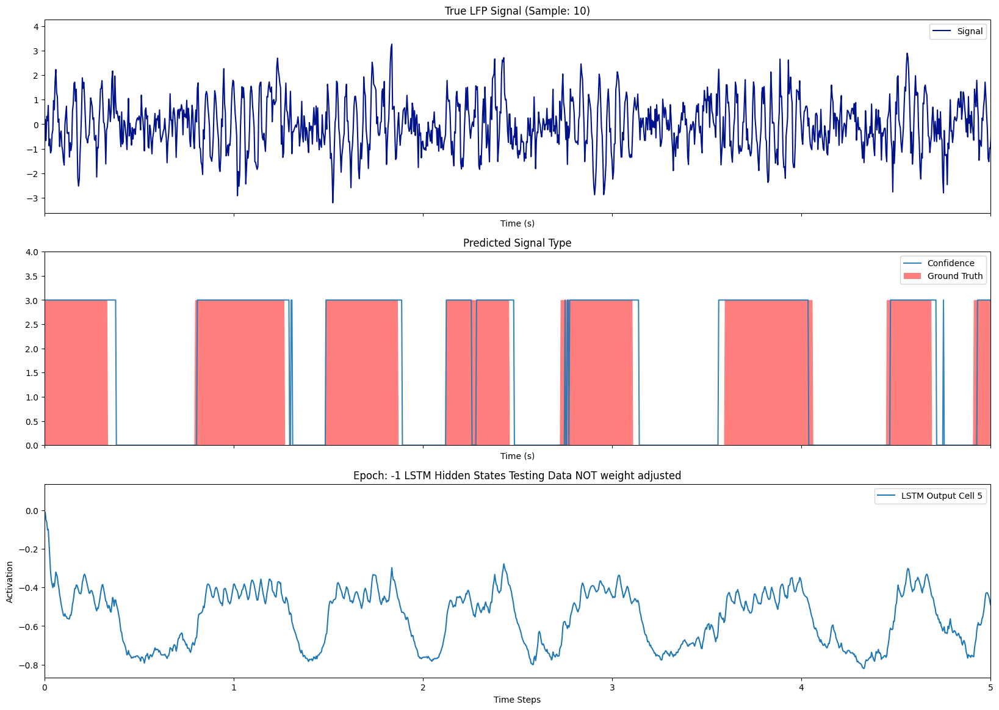

Model: mid_noise_features_multi_mid 
Sample: 14


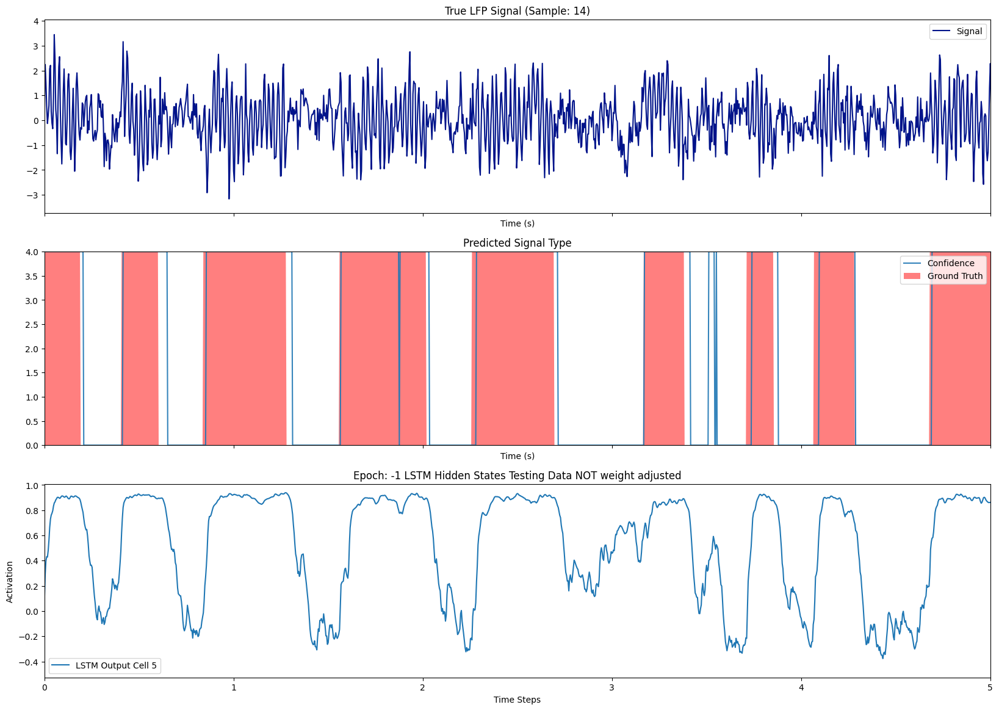

In [ ]:
special_cells = [4] # strong theta

# Zum export (theta,alpha,beta,gamma)
for sample in [2,6,10,14]:
    visualize_hidden_activation_multi(extracted_data_dict, tt_splits_dict, directory_name='mid_noise_features_multi_mid',
                                      sample_number=sample, epoch_to_visualize=-1,
                                      cells_to_visualize=special_cells)

**2b) Signal Model**

Model: mid_noise_all_signal_multi_high 
Sample: 2


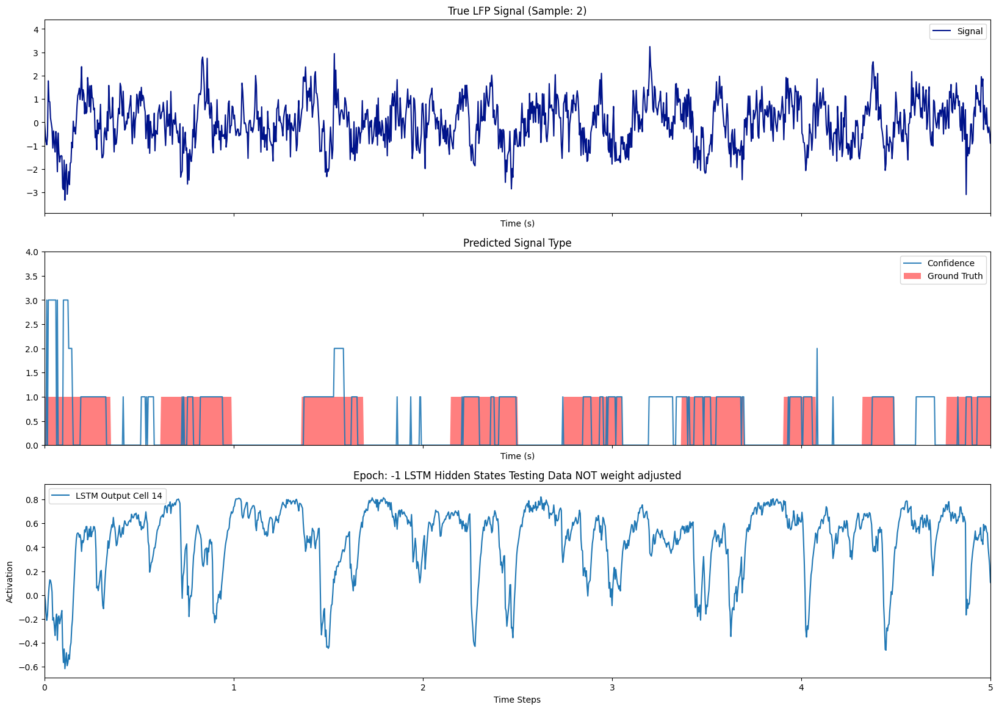

Model: mid_noise_all_signal_multi_high 
Sample: 6


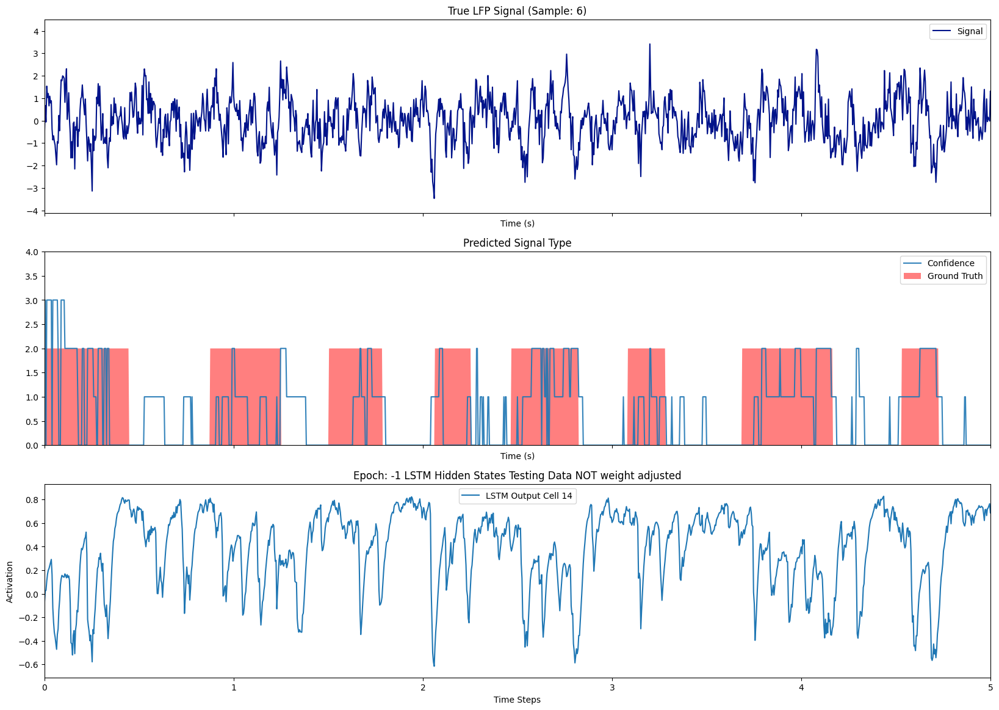

Model: mid_noise_all_signal_multi_high 
Sample: 10


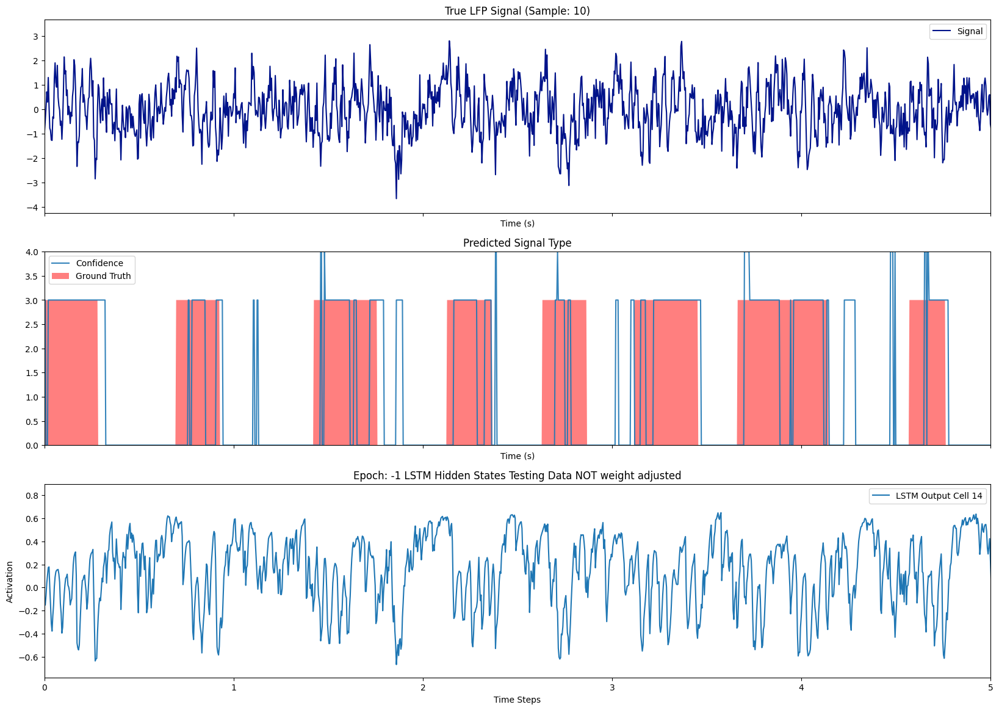

Model: mid_noise_all_signal_multi_high 
Sample: 14


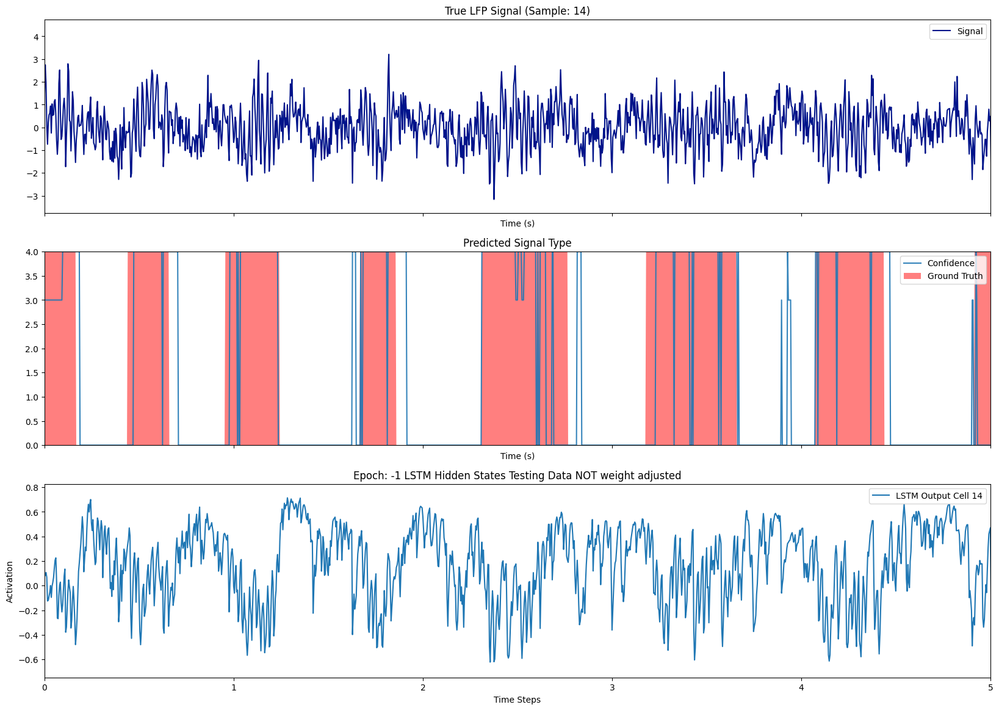

In [ ]:
special_cells = [13] # strong noise correlation

# Zum export (theta,alpha,beta,gamma)
for sample in [2,6,10,14]:
    visualize_hidden_activation_multi(extracted_data_dict, tt_splits_dict, directory_name='mid_noise_all_signal_multi_high',
                                      sample_number=sample, epoch_to_visualize=-1,
                                      cells_to_visualize=special_cells)

In [ ]:
extracted_data_dict.keys()

dict_keys(['mid_noise_all_features_multi', 'mid_noise_hilbert_multi', 'mid_noise_signal_multi'])

# HeatMaps

### HeatMap Functions

In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def create_heatmap_cell_feature_corr(cell_activations, X_train, correlation_metric=np.corrcoef, absolute=False, rounding_factor=.1, feature_names=None):
    """
    Creates a heatmap of correlation values between LSTM cell activations and input features.

    Args:
        cell_activations (np.ndarray): LSTM cell activations of shape (samples, noise_ratios, timesteps, cells).
        X_train (np.ndarray): Input features of shape (samples, noise_ratios, timesteps, features).
        correlation_metric (function, optional): The correlation metric function to use. Defaults to np.corrcoef.

    Returns:
        None: Displays the heatmap.
    """

    num_cells = cell_activations.shape[-1]  # Number of LSTM cells
    num_features = X_train.shape[-1]  # Number of input features

    # Reshape for easier calculation
    cell_activations = cell_activations.reshape(-1, num_cells)
    X_train = X_train.reshape(-1, num_features)

    correlation_matrix = np.zeros((num_cells, num_features))

    # Calculate correlation for each cell-feature pair
    for cell_index in range(num_cells):
        for feature_index in range(num_features):

          correlation_matrix[cell_index, feature_index] = correlation_metric(
                    cell_activations[:, cell_index], X_train[:, feature_index])[0, 1]

    if absolute:
        correlation_matrix = np.abs(correlation_matrix)

    if feature_names is not None:
        x_ticks = feature_names
    else:
        x_ticks = range(1, num_features + 1)
    # Create and display heatmap with annotations
    plt.figure(figsize=(16, 10))  # Adjust figure size as needed
    sns.heatmap(correlation_matrix, annot=True, cmap="viridis", fmt=f"{rounding_factor}f",
                annot_kws={"size": 11}, # Add annot=True and fmt=".2f",
                xticklabels=x_ticks, yticklabels=range(1, num_cells + 1))

    if num_features > 4:
      # Rotate x-axis labels by 45 degrees
      plt.xticks(rotation=45, ha='right', fontsize=11)

    plt.title("Correlation between LSTM Cell Activations and Input Features", fontsize=14)
    plt.xlabel("Input Feature", fontsize=12)
    plt.ylabel("LSTM Cell", fontsize=12)
    plt.show()

    return correlation_matrix

In [20]:

def create_heatmap_cell_frequency_corr(hidden_activations, y_labels, correlation_metric=np.corrcoef, absolute=False, rounding_factor=.1):
    """
    Creates a heatmap showing correlation between cell activations and frequency values.

    Args:
        hidden_activations (np.ndarray): Hidden activations of shape (20, 5, 7500, 32).
        y_labels (np.ndarray): Labels of shape (20, 5, 7500).
        correlation_metric (function, optional): The correlation metric function to use. Defaults to np.corrcoef.

    Returns:
        None: Displays the heatmap.
    """
    # Determine y-labels
    mean_freqs = np.logspace(np.log10(4), np.log10(100), num=20)
    mean_freqs_round = np.round(mean_freqs).astype(int)

    oscillation_categories = []
    for freq in mean_freqs_round:
        oscillation_categories.append(classify_burst(freq))

    num_frequencies = hidden_activations.shape[0]  # 20 frequency values
    num_cells = hidden_activations.shape[-1]  # 32 cells

    correlation_matrix = np.zeros((num_cells, num_frequencies))

    for frequency_index in range(num_frequencies):
        # Reshape activations and labels for this frequency
        activations_for_frequency = hidden_activations[frequency_index].reshape(-1, num_cells)
        labels_for_frequency = y_labels[frequency_index].flatten()

        # Calculate correlation for each cell
        for cell_index in range(num_cells):
            correlation_matrix[cell_index, frequency_index] = correlation_metric(
                activations_for_frequency[:, cell_index], labels_for_frequency)[0, 1]
    if absolute:
        correlation_matrix = np.abs(correlation_matrix)

    # Create and display heatmap
    fig, ax1 = plt.subplots(figsize=(12, 10))  # Adjust figure size as needed
    sns.heatmap(correlation_matrix, annot=True, cmap="viridis", fmt=f"{rounding_factor}f",
                xticklabels=mean_freqs_round, yticklabels=range(1, num_cells + 1), ax=ax1)
    ax1.set_title("Correlation between LSTM Cell Activations and Frequency Values")
    ax1.set_xlabel("Frequency Value in Hz")
    ax1.set_ylabel("LSTM Cell")

    # Create second x-axis for oscillation categories
    ax2 = ax1.twiny()
    ax2.set_xlim(ax1.get_xlim())  # Align x-axes
    ax2.set_xticks(ax1.get_xticks())  # Align ticks
    ax2.set_xticklabels(oscillation_categories, rotation=45, ha='left')  # Set oscillation category labels
    ax2.set_xlabel("Oscillation Category")

    plt.show()

    return correlation_matrix

In [21]:
def create_heatmap_cell_oscillation_corr(hidden_activations, y_labels, correlation_metric=np.corrcoef, absolute=False, rounding_factor=.1):
    """
    Creates a heatmap showing correlation between cell activations and oscillation categories.

    Args:
        hidden_activations (np.ndarray): Hidden activations of shape (20, 5, 7500, 32).
        y_labels (np.ndarray): Labels of shape (20, 5, 7500).
        correlation_metric (function, optional): The correlation metric function to use. Defaults to np.corrcoef.
        absolute (bool, optional): Whether to take the absolute value of the correlations. Defaults to False.
        rounding_factor (float, optional): The rounding factor for the annotation. Defaults to .1.

    Returns:
        None: Displays the heatmap.
    """
    # Determine y-labels (frequencies)
    mean_freqs = np.logspace(np.log10(4), np.log10(100), num=20)
    mean_freqs_round = np.round(mean_freqs).astype(int)

    # Determine oscillation categories for each frequency
    oscillation_categories = []
    for freq in mean_freqs_round:
        oscillation_categories.append(classify_burst(freq))

    # Define desired order of categories
    category_order = ["theta", "alpha", "beta", "gamma", "noise"]

    # Get unique oscillation categories and their indices, respecting the order
    unique_categories = [cat for cat in category_order if cat in oscillation_categories]
    num_categories = len(unique_categories)
    num_cells = hidden_activations.shape[-1]  # Number of LSTM cells

    # Initialize correlation matrix for categories
    correlation_matrix = np.zeros((num_cells, num_categories))

    # Calculate correlation for each cell-category pair
    for category_index, category in enumerate(unique_categories):
        # Find indices of frequencies belonging to this category
        category_indices = [i for i, cat in enumerate(oscillation_categories) if cat == category]

        # Extract activations and labels for this category
        activations_for_category = hidden_activations[category_indices].reshape(-1, num_cells)
        labels_for_category = y_labels[category_indices].reshape(-1)

        # Calculate correlation for each cell within this category
        for cell_index in range(num_cells):
            correlation_matrix[cell_index, category_index] = correlation_metric(
                activations_for_category[:, cell_index], labels_for_category)[0, 1]

    if absolute:
        correlation_matrix = np.abs(correlation_matrix)

    # Create and display heatmap
    plt.figure(figsize=(12, 10))  # Adjust figure size as needed
    sns.heatmap(correlation_matrix, annot=True, cmap="viridis", fmt=f"{rounding_factor}f",
                xticklabels=unique_categories, yticklabels=range(1, num_cells + 1))
    plt.title("Correlation between LSTM Cell Activations and Oscillation Categories")
    plt.xlabel("Oscillation Category")
    plt.ylabel("LSTM Cell")
    plt.show()

    return correlation_matrix

### Helper Functions

In [22]:
def classify_burst(value):
    """
    Classify a given float value into one of the predefined categories.

    Parameters:
        value (float): The input value to classify.

    Returns:
        str: The classification category as a string.
    """
    if value < 0.0:
        raise ValueError("Value must be non-negative.")

    if 0.0 <= value < 4.0:
        return "noise"
    elif 4.0 <= value < 8.0:
        return "theta"
    elif 8.0 <= value < 13.0:
        return "alpha"
    elif 13.0 <= value < 30.0:
        return "beta"
    elif 30.0 <= value < 110.0:
        return "gamma"
    else:
        raise ValueError("Value does not fall within known classification categories.")

In [23]:
def get_top_n_correlations(correlation_matrix, n=5):
    """
    Gets the top n correlations and their coordinates in the correlation matrix.

    Args:
        correlation_matrix (np.ndarray): The correlation matrix.
        n (int, optional): The number of top correlations to retrieve. Defaults to 5.

    Returns:
        list: A list of tuples, where each tuple contains (correlation_value, row_index, column_index).
    """
    # Flatten the correlation matrix and get the indices of the top n values
    flat_indices = np.argpartition(correlation_matrix.flatten(), -n)[-n:]

    # Convert flattened indices to row and column indices
    row_indices = flat_indices // correlation_matrix.shape[1]
    column_indices = flat_indices % correlation_matrix.shape[1]

    # Get the top n correlation values and their coordinates
    top_correlations = [(np.round(correlation_matrix[row, col],3), row, col)
                         for row, col in zip(row_indices, column_indices)]

    # Sort the correlations in descending order
    top_correlations.sort(reverse=True)

    return top_correlations

In [24]:
import matplotlib.lines as mlines

def plot_correlation_distribution(correlation_matrix, x_labels=None):
    """
    Plots correlation distribution with mean and standard deviation per feature using seaborn.

    Args:
        correlation_matrix (np.ndarray): The correlation matrix (features x cells).
    """
    num_features = correlation_matrix.shape[1]
    num_cells = correlation_matrix.shape[0]

    plt.figure(figsize=(16, 10))

    # Create a DataFrame for seaborn (without cell index as hue)
    df = pd.DataFrame(correlation_matrix)
    df.columns = [f"{i+1}" for i in range(num_features)]
    df_melted = df.melt(ignore_index=False).reset_index()  # Remove 'Cell' column

    # Rename columns to include the 'Cell' column
    df_melted.columns = ['Cell', 'Feature', 'Correlation']  # Rename columns, including 'Cell'

    # Create the scatter plot with seaborn (single color for all dots)
    scatter_handle = sns.scatterplot(data=df_melted, x='Feature', y='Correlation', color='red', alpha=0.5, s=140, label="Cell Correlations")  # Add label here

    # Calculate mean and standard deviation per feature
    mean_correlations = np.mean(correlation_matrix, axis=0)
    std_correlations = np.std(correlation_matrix, axis=0)

    # Plot mean and standard deviation with error bars
    plt.errorbar(range(num_features), mean_correlations, yerr=std_correlations,
                 color='black', fmt='o', capsize=10, linewidth=3, label='Mean and Std Dev', zorder=10)

    # Set plot labels and title



    # Add custom handle to the legend
    handles, labels = scatter_handle.axes.get_legend_handles_labels()  # Get existing handles and labels
    # handles.append(scatter_legend_handle)  # Append the custom scatter handle

    plt.legend(handles=handles, fontsize=14)  # Use updated handles in legend

    plt.xlabel("Feature Index", fontsize=16)
    plt.ylabel("Correlation Strength", fontsize=16)
    plt.title("Correlation Distribution per Feature", fontsize=18)
    # plt.legend(fontsize=14)
    if x_labels is not None:
        plt.xticks(range(num_features), x_labels, rotation=45, ha='right', fontsize=14)  # Set ticks and rotation
    else:
        plt.xticks(range(num_features))  # Default ticks if x_labels is None
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [25]:
def plot_feature_correlation(correlation_matrix, feature1_index, feature2_index):
    """
    Creates a scatter plot showing the correlation between two features.

    Args:
        correlation_matrix (np.ndarray): The correlation matrix.
        feature1_index (int): The index of the first feature.
        feature2_index (int): The index of the second feature.
    """

    # Extract scores for the two features
    feature1_scores = correlation_matrix[:, feature1_index]
    feature2_scores = correlation_matrix[:, feature2_index]

    # Create the scatter plot
    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    plt.scatter(feature1_scores, feature2_scores, alpha=0.7)  # Alpha for transparency

    # Set plot labels and title
    plt.xlabel(f"Feature {feature1_index + 1} Scores")
    plt.ylabel(f"Feature {feature2_index + 1} Scores")
    plt.title(f"Correlation between Feature {feature1_index + 1} and Feature {feature2_index + 1}")

    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def plot_feature_correlation_kmeans(correlation_matrix, feature1_index, feature2_index, num_clusters=3):
    """
    Creates a scatter plot with k-means clustering
    showing the correlation between two features.

    Args:
        correlation_matrix (np.ndarray): The correlation matrix.
        feature1_index (int): The index of the first feature.
        feature2_index (int): The index of the second feature.
        num_clusters (int, optional): The number of clusters for k-means. Defaults to 3.
    """

    # Extract scores for the two features
    feature1_scores = correlation_matrix[:, feature1_index]
    feature2_scores = correlation_matrix[:, feature2_index]

    # Combine the features into a 2D array for k-means
    X = np.vstack((feature1_scores, feature2_scores)).T

    # Perform k-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)  # random_state for reproducibility
    kmeans.fit(X)
    labels = kmeans.labels_
    cluster_centers = kmeans.cluster_centers_

    # Create the scatter plot with cluster colors
    plt.figure(figsize=(8, 6))
    plt.scatter(feature1_scores, feature2_scores, c=labels, cmap='viridis', alpha=0.7)

    # Plot cluster centers
    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='x', s=200, linewidths=3, color='black', zorder=10)

    # Set plot labels and title
    plt.xlabel(f"Feature {feature1_index + 1} Scores")
    plt.ylabel(f"Feature {feature2_index + 1} Scores")

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull
import numpy as np

def plot_feature_correlation_kmeans_borders(correlation_matrix, feature1_index, feature2_index, num_clusters=3, feature_names=["x_feature", "y_feature"]):
    """
    Creates a scatter plot with k-means clustering, showing correlation between two features,
    and annotates each point with the cell index.

    Args:
        correlation_matrix (np.ndarray): The correlation matrix.
        feature1_index (int): The index of the first feature.
        feature2_index (int): The index of the second feature.
        num_clusters (int, optional): The number of clusters for k-means. Defaults to 3.
        feature_names (list, optional): Names for the features. Defaults to ["x_feature", "y_feature"].
    """

    # Extract scores for the two features
    feature1_scores = correlation_matrix[:, feature1_index]
    feature2_scores = correlation_matrix[:, feature2_index]

    # Combine the features into a 2D array for k-means
    X = np.vstack((feature1_scores, feature2_scores)).T

    # Perform k-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    kmeans.fit(X)
    labels = kmeans.labels_

    # Create a list of lists to store cell IDs for each cluster
    clustered_cell_ids = [[] for _ in range(num_clusters)]
    for cell_id, cluster_id in enumerate(labels):
        clustered_cell_ids[cluster_id].append(cell_id + 1)  # Add cell ID to the corresponding cluster list

    # Create the plot
    plt.figure(figsize=(12, 8))
    sns.set(style="whitegrid")

    # Assign unique markers and colors
    markers = ['o', 'o', 'o']
    colors = sns.color_palette("Set2", n_colors=num_clusters + 3)[0:]

    # Plot each cluster with cell index annotations
    for cluster in range(num_clusters):
        cluster_points = X[labels == cluster]
        plt.scatter(
            cluster_points[:, 0],
            cluster_points[:, 1],
            label=f'Cluster {cluster + 1}',
            alpha=0.9,
            marker=markers[cluster % len(markers)],
            color=colors[cluster],
             s=150
        )

        # Annotate each point with cell index
        for i, point in enumerate(cluster_points):
            cell_index = np.where(np.all(X == point, axis=1))[0][0] + 1  # Get original cell index
            plt.annotate(cell_index, (point[0], point[1]), fontsize=9, ha='center', va='center', color="black")

        # Draw the convex hull around the cluster
        if len(cluster_points) > 2:
            hull = ConvexHull(cluster_points)
            hull_points = np.append(hull.vertices, hull.vertices[0])
            plt.plot(
                cluster_points[hull_points, 0],
                cluster_points[hull_points, 1],
                color=colors[cluster],
                alpha=0.8
            )

    # Add labels and legend
    # plt.title("k-means Clustering")
    plt.xlabel(feature_names[0])
    plt.ylabel(feature_names[1])
    plt.legend(loc='lower right')
    plt.show()

    return clustered_cell_ids

## Cell to Input Feature Correlation

For Reference:
- Feature 0: Truth Label
- Feature 1: Signal
- Feature 2: Theta Hilbert
- Feature 3: Alpha Hilbert
- Feature 4: Beta Hilbert
- Feature 5: Gamma Hilbert
- Feature 6-25: Wavelets from (4-100Hz)
  - Wavelets in Hz: [  4   5   6   7   8   9  11  13  16  18  22  26  31  36  43  51  60  71
    84 100]
  - Feature 6-9: Theta Wavelet (4x)
  - Feature 10-12: Alpha Wavelet (3x)
  - Feature 13-17: Beta Wavelet (5x)
  - Feature 18-25: Gamma Wavelet (8x)

In [28]:
extracted_data_dict.keys()

dict_keys(['beta_binary_signal_deep', 'beta_binary_signal', 'beta_binary_hilbert_only', 'beta_binary_wavelet_only', 'beta_binary_hilbert_included', 'beta_binary_wavelet_included', 'beta_binary_all_features'])

In [29]:
au.explain_dict_structure(tt_splits_dict['beta_binary_all_features'])
au.explain_dict_structure(extracted_data_dict['beta_binary_all_features'])

X_test:
   Shape: (10, 5, 7500, 7)
y_test:
   Shape: (10, 5, 7500)

hidden_states_activation:
   Shape: (1, 10, 5, 7500, 32)
model_predictions:
   Shape: (1, 10, 5, 7500, 1)
final_hidden_states:
   Shape: (1, 10, 5, 32)
final_cell_states:
   Shape: (1, 10, 5, 32)
dense_weights:
   Shape: (1, 32, 1)
dense_bias:
   Shape: (1, 1)



### All Features

In [30]:
model_name = "beta_binary_all_features"

feature_names=["Ground Truth", "Model Prediction", "Signal","Hilbert Amp", "Wavelet 13Hz", "Wavelet 16Hz",
               "Wavelet 18Hz", "Wavelet 22Hz", "Wavelet 26Hz"]

(10, 5, 7500, 9)


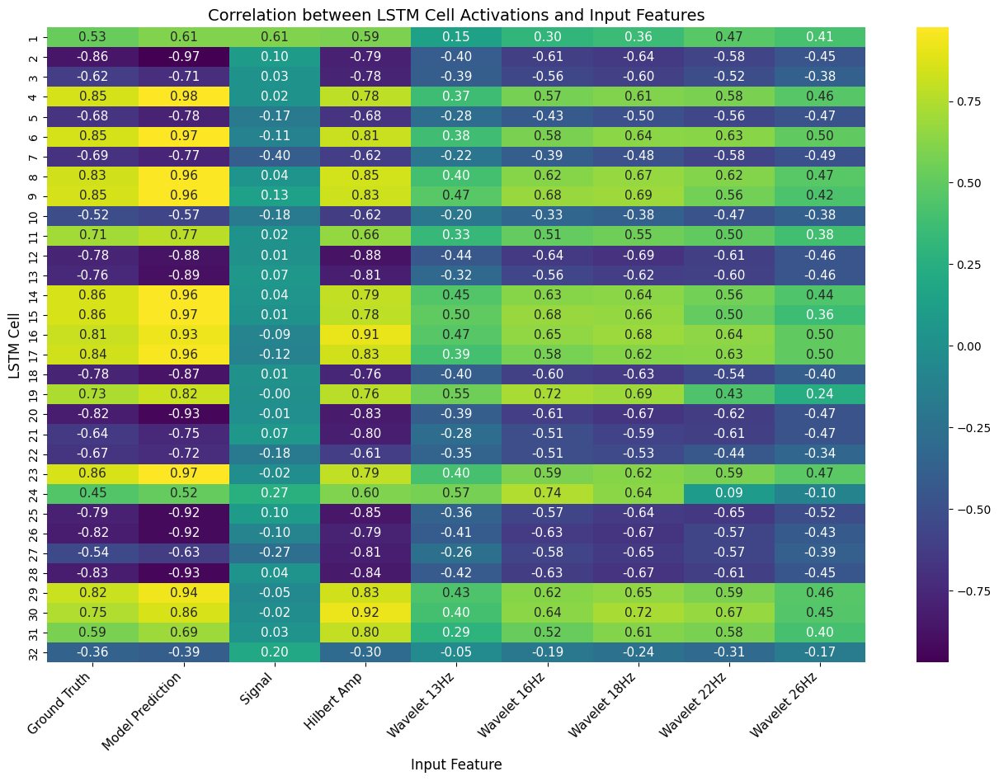

In [31]:
from scipy.stats import pearsonr

cell_activations = extracted_data_dict[model_name]['hidden_states_activation'][-1]

model_pred = extracted_data_dict[model_name]['model_predictions'][-1]
testing_features = tt_splits_dict[model_name]['X_test']

testing_label = tt_splits_dict[model_name]['y_test']
testing_label = np.expand_dims(testing_label, axis=-1)

testing_features = np.concatenate((testing_label, model_pred, testing_features), axis=-1)
print(testing_features.shape)

features_corr_matrix = create_heatmap_cell_feature_corr(cell_activations, testing_features, absolute=False,
                                                        feature_names=feature_names,
                                                        rounding_factor=.2)

We can see that the hilbert amp is most popluar to take as shape. Esepcially the theta one.

My data is slightly skewed to have most gamma oscillations and that could be the reason for it.

In [35]:
np.mean(abs(features_corr_matrix), axis=0)

array([0.72872853, 0.82840195, 0.10936828, 0.75962192, 0.36634449,
       0.56181251, 0.60164646, 0.54675572, 0.41637403])

In [ ]:
features_corr_matrix.shape

(32, 9)

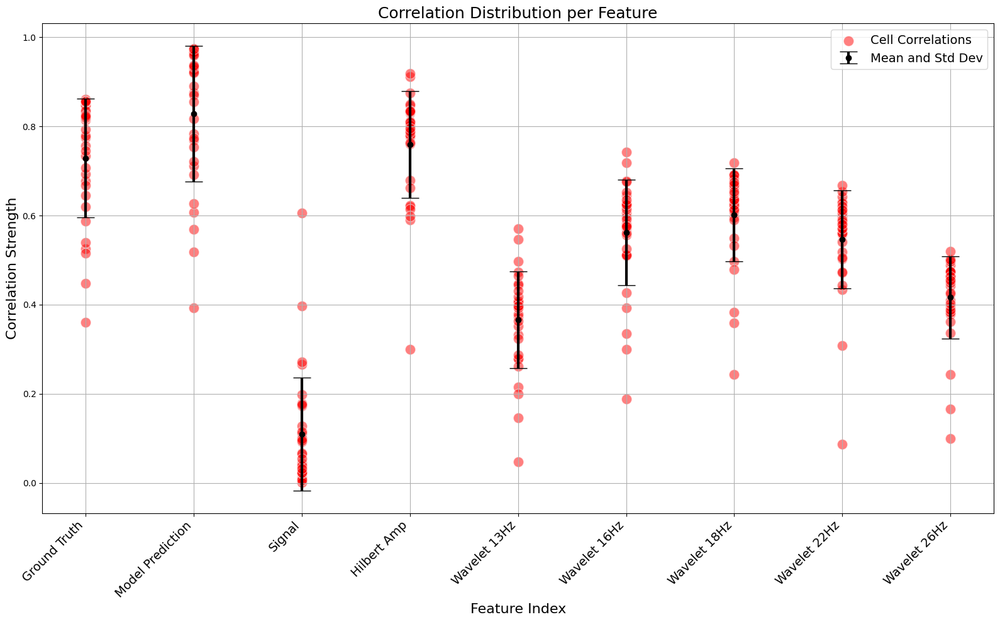

In [ ]:
plot_correlation_distribution(abs(features_corr_matrix), x_labels=feature_names)

In [ ]:
# Shape (correlation, column, row)
# Shape (corr, Cell, Feature)
top_corr = get_top_n_correlations(features_corr_matrix, n=10)
print(top_corr)

[(np.float64(0.976), np.int64(3), np.int64(1)), (np.float64(0.974), np.int64(22), np.int64(1)), (np.float64(0.974), np.int64(5), np.int64(1)), (np.float64(0.966), np.int64(14), np.int64(1)), (np.float64(0.964), np.int64(8), np.int64(1)), (np.float64(0.964), np.int64(7), np.int64(1)), (np.float64(0.962), np.int64(13), np.int64(1)), (np.float64(0.959), np.int64(16), np.int64(1)), (np.float64(0.937), np.int64(28), np.int64(1)), (np.float64(0.927), np.int64(15), np.int64(1))]


In [ ]:
feature_names

['Ground Truth',
 'Model Prediction',
 'Signal',
 'Hilbert Amp',
 'Wavelet 13Hz',
 'Wavelet 16Hz',
 'Wavelet 18Hz',
 'Wavelet 22Hz',
 'Wavelet 26Hz']

Model: beta_binary_all_features 
Sample: 1
Number of Features: 7
Noise Ratios: 0
Visualizing Cells: [0, 1, 5, 23, 31]
7 (10, 5, 7500, 7)
['Signal', 'Hilbert Amp', 'Wavelet 13Hz', 'Wavelet 16Hz', 'Wavelet 18Hz', 'Wavelet 22Hz', 'Wavelet 26Hz']


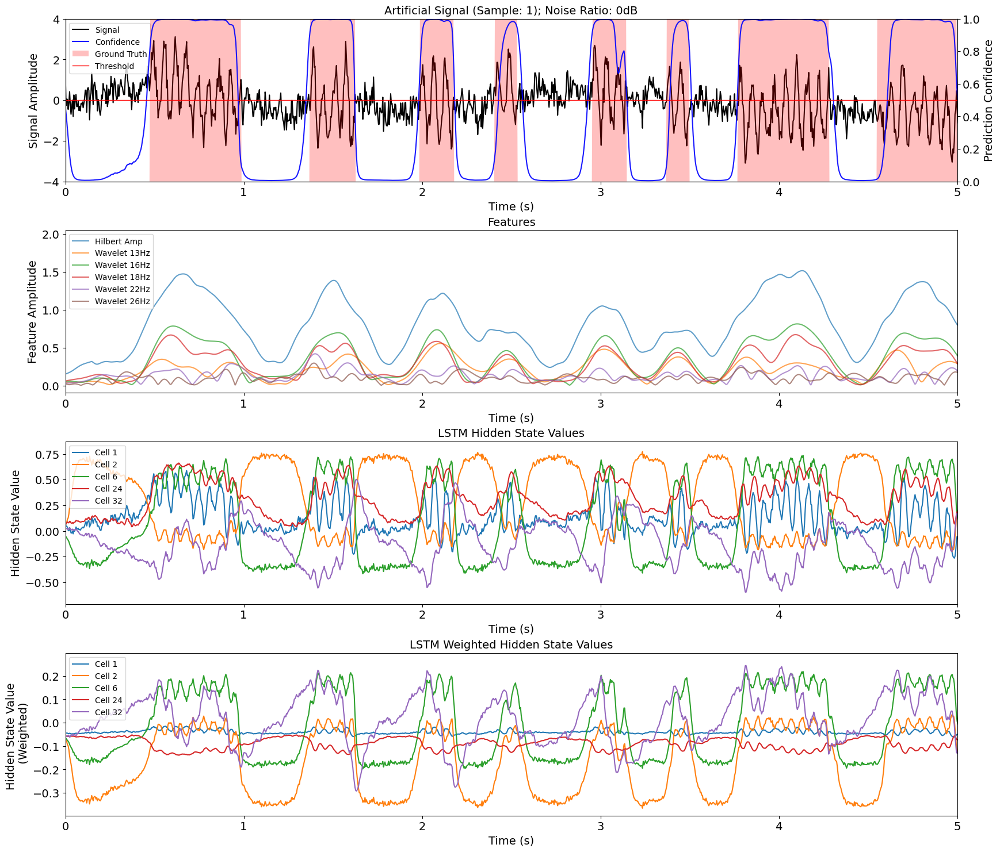

In [63]:
special_cells = [0,1,5,23,31]
noise_ratio = 2
sample_id = 1
epoch = -1
signal_only = tt_splits_dict['beta_binary_signal']['X_test'][sample_id, noise_ratio, : , 0]

visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, signal_only, directory_name=model_name,
                                      sample_number=sample_id, epoch_to_visualize=-1,
                                      noise_ratio=noise_ratio,
                                      cells_to_visualize=special_cells,
                                      weighted_cells=True,
                                      feature_labels=feature_names[2:])

In [ ]:
extracted_data_dict.keys()

dict_keys(['beta_binary_hilbert_only', 'beta_binary_signal', 'beta_binary_all_features', 'beta_binary_wavelet_included', 'beta_binary_hilbert_included', 'beta_binary_wavelet_only'])

### Hilberts

In [ ]:
model_name = "beta_binary_hilbert_included"
feature_names = ["Ground Truth", "Model Prediction", "Signal","Hilbert Amp" ]

(10, 5, 7500, 4)
['Ground Truth', 'Model Prediction', 'Signal', 'Hilbert Amp']


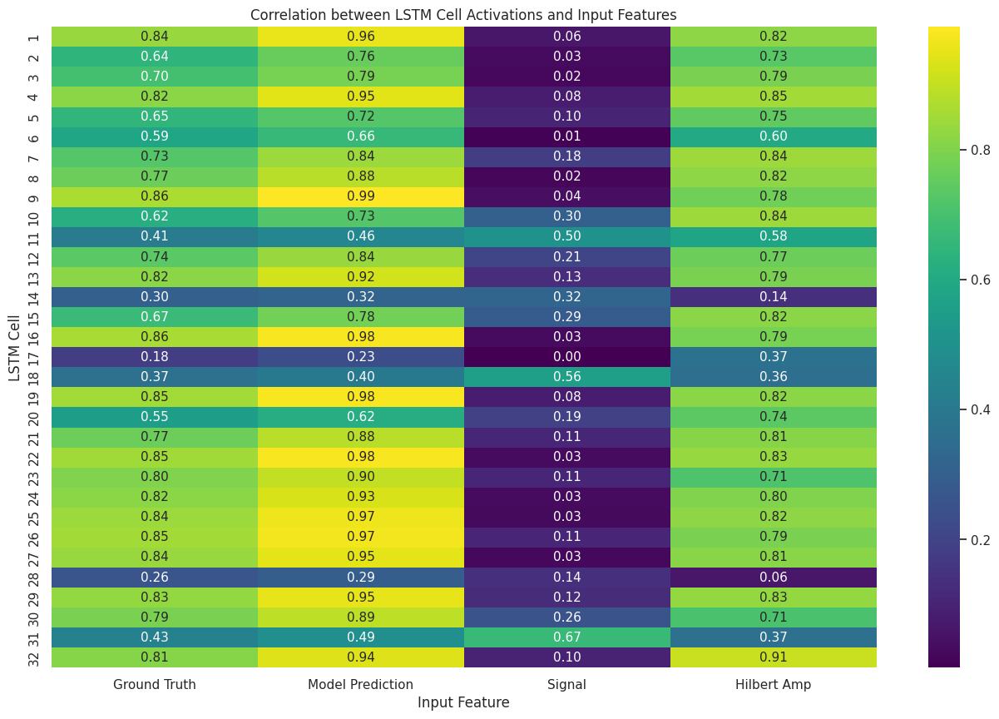

In [ ]:
from scipy.stats import pearsonr

cell_activations = extracted_data_dict[model_name]['hidden_states_activation'][-1]

model_pred = extracted_data_dict[model_name]['model_predictions'][-1]
testing_features = tt_splits_dict[model_name]['X_test']

testing_label = tt_splits_dict[model_name]['y_test']
testing_label = np.expand_dims(testing_label, axis=-1)

testing_features = np.concatenate((testing_label, model_pred, testing_features), axis=-1)
print(testing_features.shape)
print(feature_names)
hilbert_corr_matrix = create_heatmap_cell_feature_corr(cell_activations, testing_features, absolute=True, rounding_factor=.2,
                                                       feature_names=feature_names)

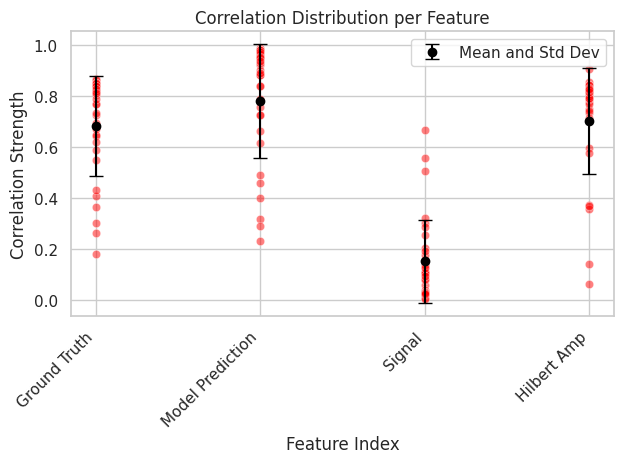

In [ ]:
plot_correlation_distribution(abs(hilbert_corr_matrix), x_labels=feature_names)

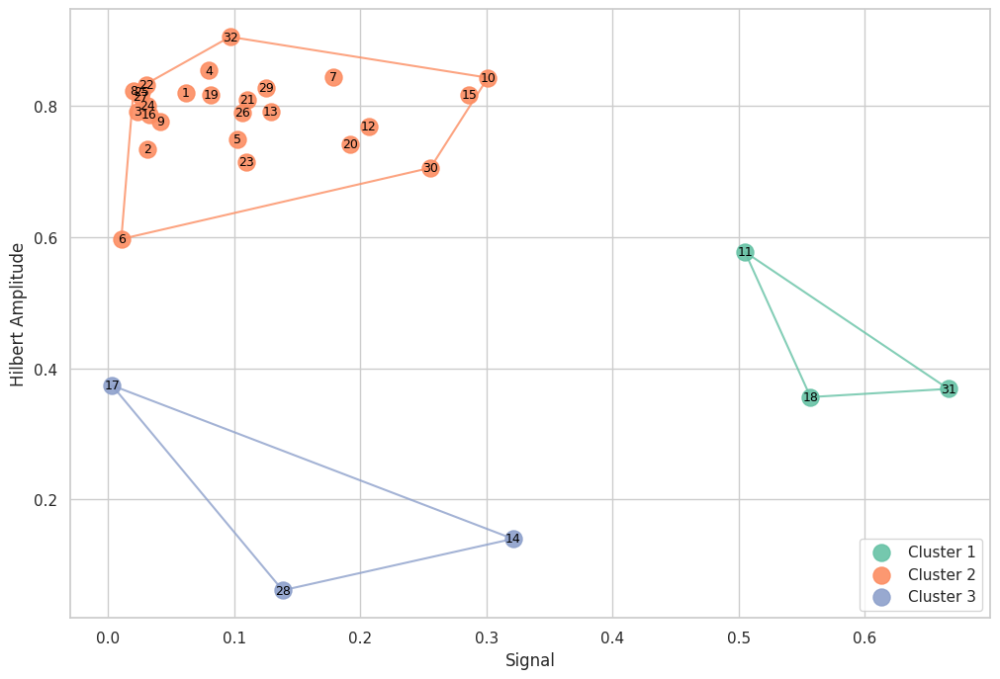

[[11, 18, 31],
 [1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  12,
  13,
  15,
  16,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  29,
  30,
  32],
 [14, 17, 28]]

In [ ]:
plot_feature_correlation_kmeans_borders(hilbert_corr_matrix,
                                        feature1_index=2,
                                        feature2_index=3,
                                        num_clusters=3,
                                        feature_names=["Signal", "Hilbert Amplitude"])

In [ ]:
hilbert_corr_matrix[:,2:].shape


(32, 2)

In [ ]:
top_corr = get_top_n_correlations(hilbert_corr_matrix, n=10)
print(top_corr)

[(np.float64(0.977), np.int64(3), np.int64(1)), (np.float64(0.975), np.int64(22), np.int64(1)), (np.float64(0.974), np.int64(5), np.int64(1)), (np.float64(0.967), np.int64(14), np.int64(1)), (np.float64(0.965), np.int64(8), np.int64(1)), (np.float64(0.965), np.int64(7), np.int64(1)), (np.float64(0.963), np.int64(13), np.int64(1)), (np.float64(0.959), np.int64(16), np.int64(1)), (np.float64(0.938), np.int64(28), np.int64(1)), (np.float64(0.925), np.int64(15), np.int64(1))]


Model: beta_binary_hilbert_included 
Sample: 8
Number of Features: 2
Noise Ratios: 0
Visualizing Cells: [8, 18, 27, 30]
2 (10, 5, 7500, 2)
['Model Prediction', 'Signal', 'Hilbert Amp']


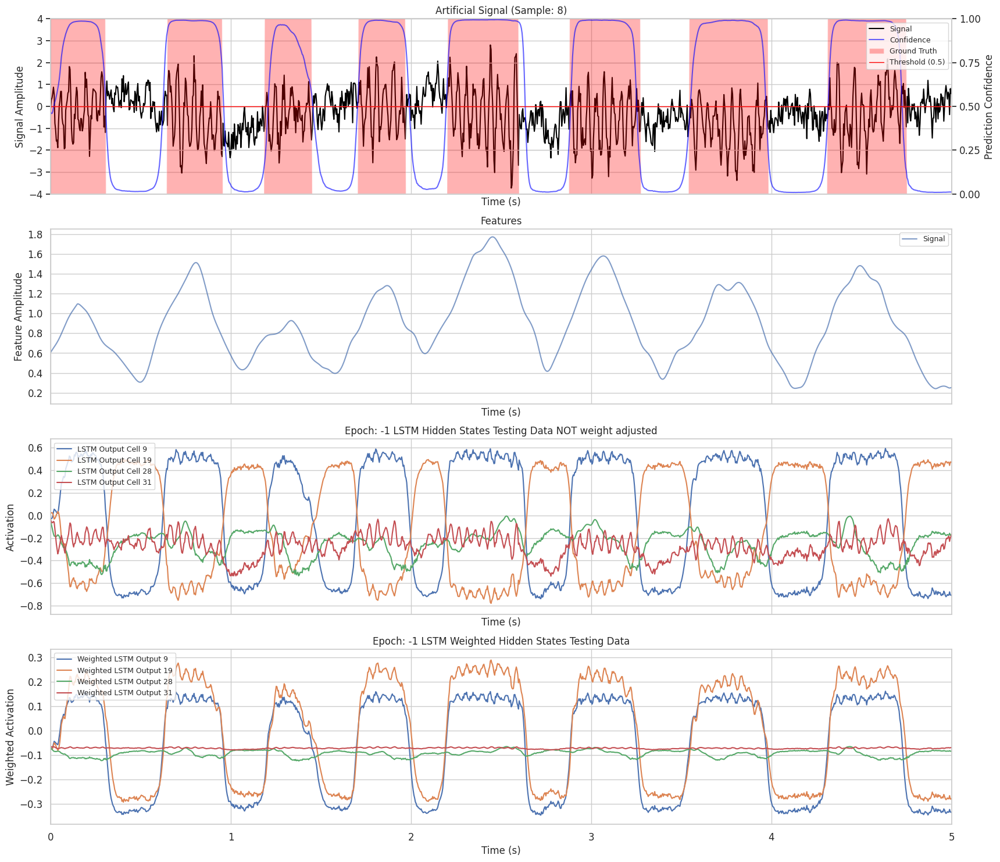

In [ ]:
special_cells = [8,18,27,30]
noise_ratio = 2
sample_id = 8

signal_only = tt_splits_dict['beta_binary_signal']['X_test'][sample_id, noise_ratio, : , 0]

visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, signal_only, directory_name=model_name,
                                      sample_number=sample_id, epoch_to_visualize=-1,
                                      noise_ratio=noise_ratio,
                                      cells_to_visualize=special_cells,
                                      weighted_cells=True,
                                      feature_labels=feature_names[1:])

### Signal Only

In [40]:
model_name = "beta_binary_signal_deep"

(10, 5, 7500, 3)


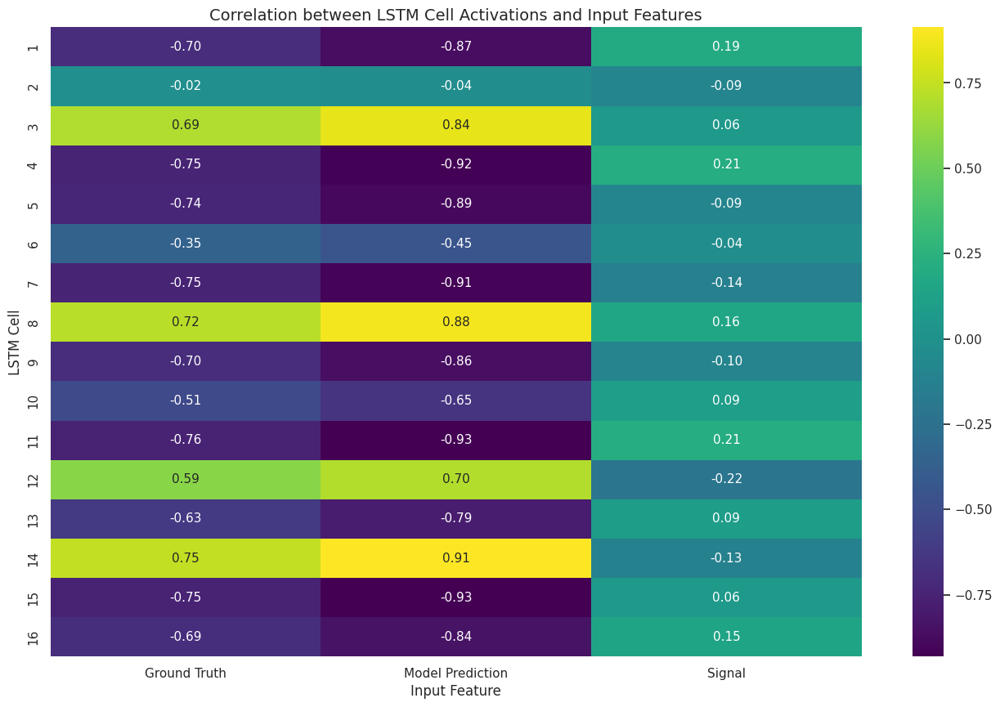

In [41]:
cell_activations = extracted_data_dict[model_name]['hidden_states_activation'][-1]

model_pred = extracted_data_dict[model_name]['model_predictions'][-1]
testing_features = tt_splits_dict[model_name]['X_test']

testing_label = tt_splits_dict[model_name]['y_test']
testing_label = np.expand_dims(testing_label, axis=-1)

testing_features = np.concatenate((testing_label, model_pred, testing_features), axis=-1)
print(testing_features.shape)

signal_corr_matrix_deep = create_heatmap_cell_feature_corr(cell_activations, testing_features, absolute=False,
                                                      rounding_factor=.2, feature_names=feature_names[:3])

(10, 5, 7500, 3)


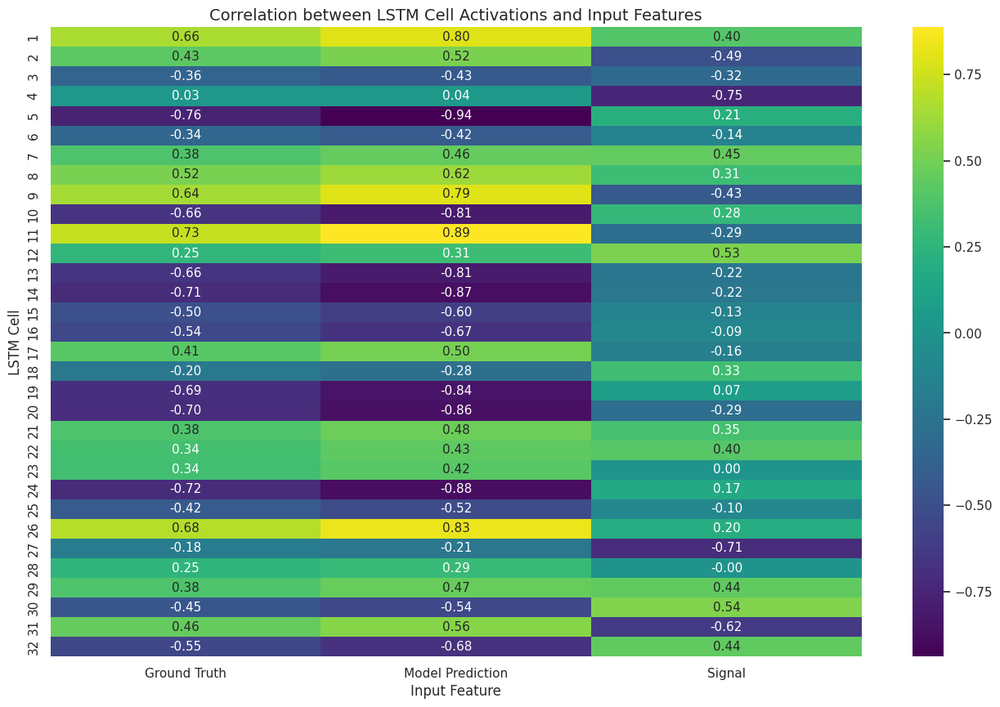

In [42]:
model_name = "beta_binary_signal"

cell_activations = extracted_data_dict[model_name]['hidden_states_activation'][-1]

model_pred = extracted_data_dict[model_name]['model_predictions'][-1]
testing_features = tt_splits_dict[model_name]['X_test']

testing_label = tt_splits_dict[model_name]['y_test']
testing_label = np.expand_dims(testing_label, axis=-1)

testing_features = np.concatenate((testing_label, model_pred, testing_features), axis=-1)
print(testing_features.shape)

signal_corr_matrix = create_heatmap_cell_feature_corr(cell_activations, testing_features, absolute=False,
                                                      rounding_factor=.2, feature_names=feature_names[:3])

In [132]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull
import numpy as np


def plot_feature_correlation_kmeans_borders_two_matrices(
    correlation_matrix1,
    correlation_matrix2,
    feature1_index,
    feature2_index,
    num_clusters=3,
    feature_names=["x_feature", "y_feature"],
    matrix1_label="Matrix 1",
    matrix2_label="Matrix 2",
):
    """
    Creates a scatter plot with k-means clustering for two correlation matrices,
    showing correlation between two features, and annotates each point with the
    cell index. Differentiates clusters by color and matrix.

    Args:
        correlation_matrix1 (np.ndarray): The first correlation matrix.
        correlation_matrix2 (np.ndarray): The second correlation matrix.
        feature1_index (int): The index of the first feature.
        feature2_index (int): The index of the second feature.
        num_clusters (int, optional): The number of clusters for k-means. Defaults to 3.
        feature_names (list, optional): Names for the features. Defaults to ["x_feature", "y_feature"].
        matrix1_label (str, optional): Label for the first matrix in the legend. Defaults to "Matrix 1".
        matrix2_label (str, optional): Label for the second matrix in the legend. Defaults to "Matrix 2".
    """

    # Extract scores for the two features from both matrices
    feature1_scores1 = correlation_matrix1[:, feature1_index]
    feature2_scores1 = correlation_matrix1[:, feature2_index]
    feature1_scores2 = correlation_matrix2[:, feature1_index]
    feature2_scores2 = correlation_matrix2[:, feature2_index]

    # Combine features for k-means for both matrices
    X1 = np.vstack((feature1_scores1, feature2_scores1)).T
    X2 = np.vstack((feature1_scores2, feature2_scores2)).T

    # Perform k-means clustering for both matrices
    kmeans1 = KMeans(n_clusters=num_clusters, random_state=0)
    kmeans1.fit(X1)
    labels1 = kmeans1.labels_

    kmeans2 = KMeans(n_clusters=num_clusters, random_state=0)
    kmeans2.fit(X2)
    labels2 = kmeans2.labels_

    # Create the plot
    plt.figure(figsize=(12, 8))
    sns.set(style="whitegrid")

    # Assign unique markers and colors for each matrix
    markers = ['o', "s"]
    colors1 = sns.color_palette("Oranges", n_colors=num_clusters)  # Colors for matrix 1
    colors2 = sns.color_palette("Blues", n_colors=num_clusters)  # Colors for matrix 2

    # Plot clusters for matrix 1
    for cluster in range(num_clusters):
        cluster_points = X1[labels1 == cluster]
        plt.scatter(
            cluster_points[:, 0],
            cluster_points[:, 1],
            label=f'{matrix1_label} - Cluster {cluster + 1}',
            alpha=0.8,
            marker=markers[0],
            color=colors1[cluster],
            s=150,
            zorder=3,
        )
        for i, point in enumerate(cluster_points):
            cell_index = np.where(np.all(X1 == point, axis=1))[0][0] + 1
            plt.annotate(cell_index, (point[0], point[1]), fontsize=9, ha='center', va='center', color="black")

        if len(cluster_points) > 2:
            hull = ConvexHull(cluster_points)
            hull_points = np.append(hull.vertices, hull.vertices[0])
            plt.plot(
                cluster_points[hull_points, 0],
                cluster_points[hull_points, 1],
                color=colors1[cluster],
                alpha=0.8,
            )


    # Plot clusters for matrix 2
    for cluster in range(num_clusters):
        cluster_points = X2[labels2 == cluster]
        plt.scatter(
            cluster_points[:, 0],
            cluster_points[:, 1],
            label=f'{matrix2_label} - Cluster {cluster + 1}',
            alpha=1,
            marker=markers[1],
            color=colors2[cluster],
            s=120,
        )
        for i, point in enumerate(cluster_points):
            cell_index = np.where(np.all(X2 == point, axis=1))[0][0] + 1  # Get original cell index
            if cluster == 2:
              plt.annotate(cell_index, (point[0], point[1]), fontsize=9, ha='center', va='center', color="white")
            else:
              plt.annotate(cell_index, (point[0], point[1]), fontsize=9, ha='center', va='center', color="black")

        if len(cluster_points) > 2:
            hull = ConvexHull(cluster_points)
            hull_points = np.append(hull.vertices, hull.vertices[0])
            plt.plot(
                cluster_points[hull_points, 0],
                cluster_points[hull_points, 1],
                color=colors2[cluster],
                alpha=0.9,
                zorder=2,
            )

    # Add labels, legend, and title
    plt.xlabel(feature_names[0])
    plt.ylabel(feature_names[1])
    plt.title("K-means Clustering of Simple and Deep Correlation Matrices")  # Add title
     # Create the legend
    handles, labels = plt.gca().get_legend_handles_labels()
    legend = plt.legend(handles, labels, loc='center right', fontsize=10, frameon=True,
                        framealpha=0.8, markerscale=.8, bbox_to_anchor=(1, 0.52))

    plt.show()

In [134]:
max(abs(signal_corr_matrix[:,2]))

np.float64(0.7457980984377378)

In [135]:
max(abs(signal_corr_matrix_deep[:,2]))

np.float64(0.21512724996012494)

In [113]:
x = (abs(signal_corr_matrix[:,0]) > 0.5)
print(x.sum())

x = (abs(signal_corr_matrix_deep[:,0]) > 0.5)
print(x.sum())

14
14


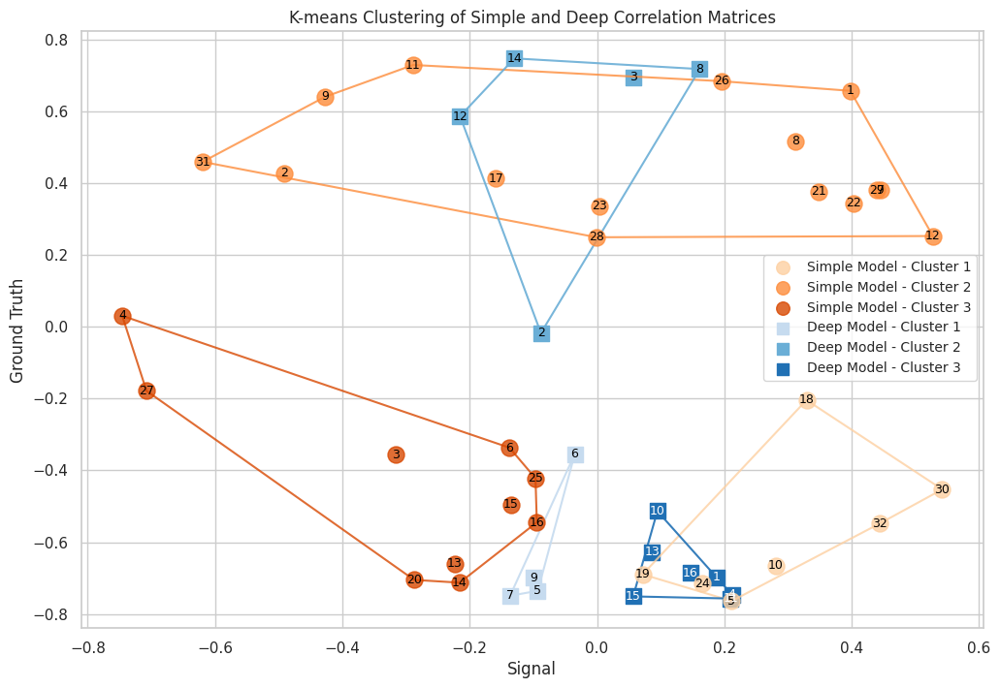

In [133]:
cluster_list = plot_feature_correlation_kmeans_borders_two_matrices(
    signal_corr_matrix,  # Your first correlation matrix
    signal_corr_matrix_deep,  # Your second correlation matrix
    2,  # Feature 1 index (Signal)
    0,  # Feature 2 index (Ground Truth)
    num_clusters=3,
    feature_names=["Signal", "Ground Truth"],
    matrix1_label="Simple Model",  # Label for the first matrix
    matrix2_label="Deep Model",  # Label for the second matrix
)

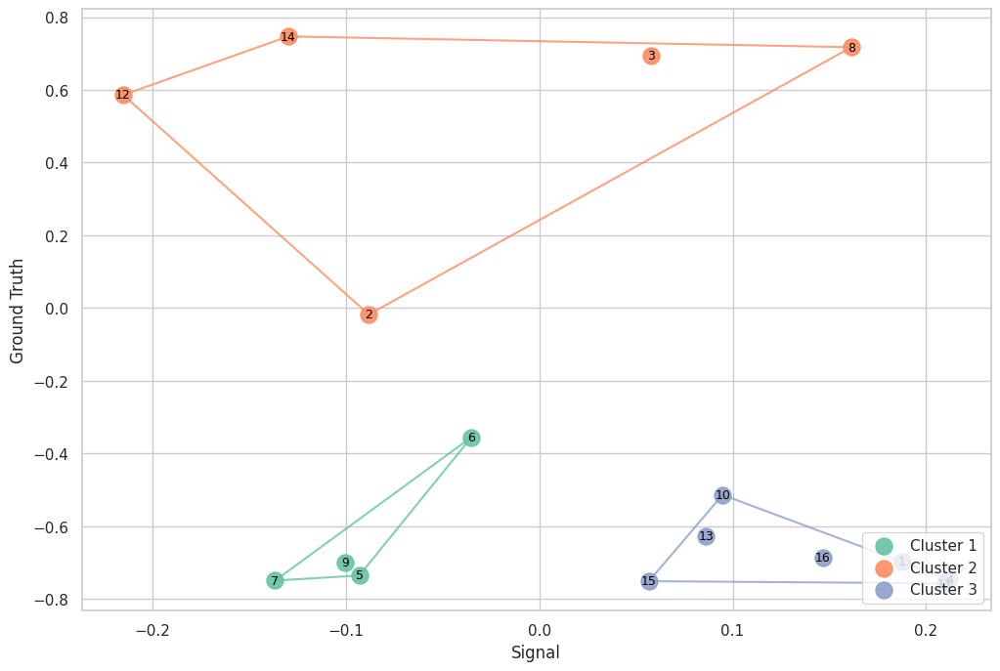

In [36]:
cluster_list = plot_feature_correlation_kmeans_borders((signal_corr_matrix), 2, 0, 3, ["Signal", "Ground Truth"])

In [ ]:
cluster_list

[[5, 6, 7, 9], [2, 3, 8, 12, 14], [1, 4, 10, 11, 13, 15, 16]]

Model: beta_binary_signal_deep 
Sample: 8
Number of Features: 1
Noise Ratios: -8
Visualizing Cells: [1, 6, 13]
1 (10, 5, 7500, 1)


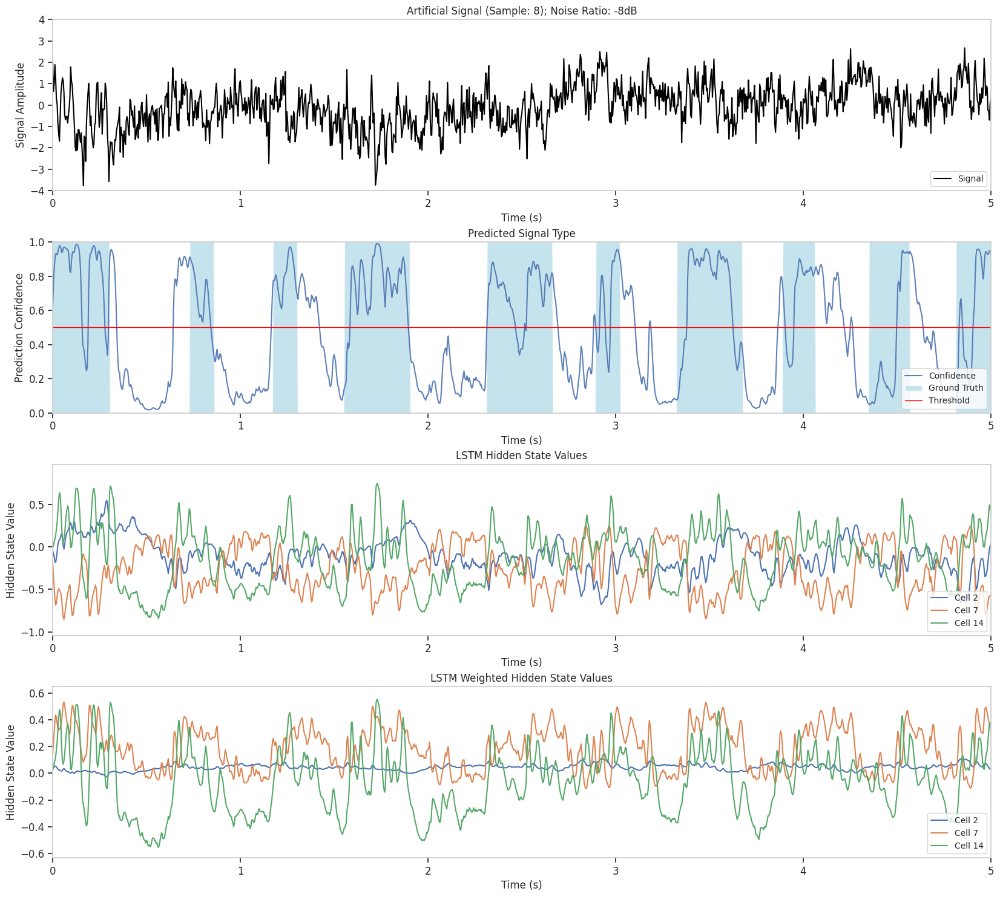

In [ ]:
special_cells = [1, 6, 13] # DEEP: Cell 1 Bad, Cell 13 Good (Pos), Cell 10 Good (neg)
#special_cells = [3, 4, 22]

noise_ratio = 0

sample_id = 8


signal_only = tt_splits_dict[model_name]['X_test'][sample_id, noise_ratio, : , 0]

visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, signal_only, directory_name=model_name,
                                      sample_number=sample_id, epoch_to_visualize=-1,
                                      noise_ratio=noise_ratio,
                                      cells_to_visualize=special_cells,
                                      weighted_cells=True,
                                      feature_labels=feature_names[1:])

## Cells on Noise Levels

In [ ]:

def create_heatmap_cell_noise_corr(hidden_activations, y_labels, correlation_metric=np.corrcoef, absolute=False, rounding_factor=.1):
    """
    Creates a heatmap showing correlation between cell activations and frequency values.

    Args:
        hidden_activations (np.ndarray): Hidden activations of shape (20, 5, 7500, 32).
        y_labels (np.ndarray): Labels of shape (20, 5, 7500).
        correlation_metric (function, optional): The correlation metric function to use. Defaults to np.corrcoef.

    Returns:
        None: Displays the heatmap.
    """
    y_labels = y_labels.copy()
    # Modify all bursts to be binary, maybe correaltions more meaningfull that way
    # y_labels[y_labels > 1] = 1
    # y_labels[y_labels < 1] = -1

    num_noises = hidden_activations.shape[1]  # 5 noise values
    num_cells = hidden_activations.shape[-1]  # 32 cells

    noise_values = [-8,-4,0,4,8]

    correlation_matrix = np.zeros((num_cells, num_noises))

    for noise_idx in range(num_noises):
        # Reshape activations and labels for this frequency
        activations_for_frequency = hidden_activations[:,noise_idx].reshape(-1, num_cells)
        labels_for_frequency = y_labels[:,noise_idx].flatten()

        # Calculate correlation for each cell
        for cell_index in range(num_cells):
            correlation_matrix[cell_index, noise_idx] = correlation_metric(
                activations_for_frequency[:, cell_index], labels_for_frequency)[0, 1]
    if absolute:
        correlation_matrix = np.abs(correlation_matrix)

    # Create and display heatmap
    fig, ax1 = plt.subplots(figsize=(12, 10))  # Adjust figure size as needed
    sns.heatmap(correlation_matrix, annot=True, cmap="viridis", fmt=f"{rounding_factor}f",
                xticklabels=noise_values, yticklabels=range(1, num_cells + 1), ax=ax1)
    ax1.set_title("Correlation between LSTM Cell Activations and groundtruth for different noise levels")
    ax1.set_xlabel("Burst-Noise Ratio in dB")
    ax1.set_ylabel("LSTM Cell")

    plt.show()

    return correlation_matrix

In [ ]:
extracted_data_dict.keys()

dict_keys(['beta_binary_hilbert_only', 'beta_binary_signal', 'beta_binary_all_features', 'beta_binary_wavelet_included', 'beta_binary_hilbert_included', 'beta_binary_wavelet_only'])

### All Features

(10, 5, 7500, 32)
(10, 5, 7500)


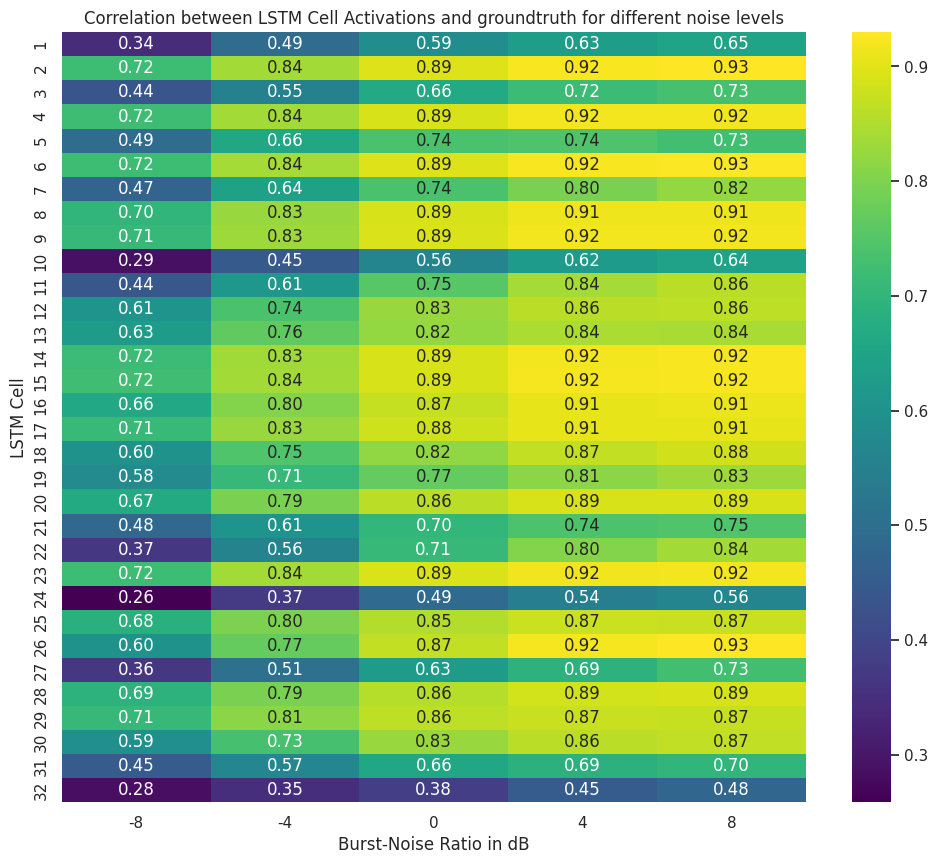

In [ ]:
model_name = "beta_binary_all_features"

cell_activations_feature = extracted_data_dict[model_name]['hidden_states_activation'][-1]

y_labels_feature = tt_splits_dict[model_name]['y_test']

print(cell_activations_feature.shape)
print(y_labels_feature.shape)

feature_correlation_matrix = create_heatmap_cell_noise_corr(cell_activations_feature, y_labels_feature, absolute=True, rounding_factor=.2)


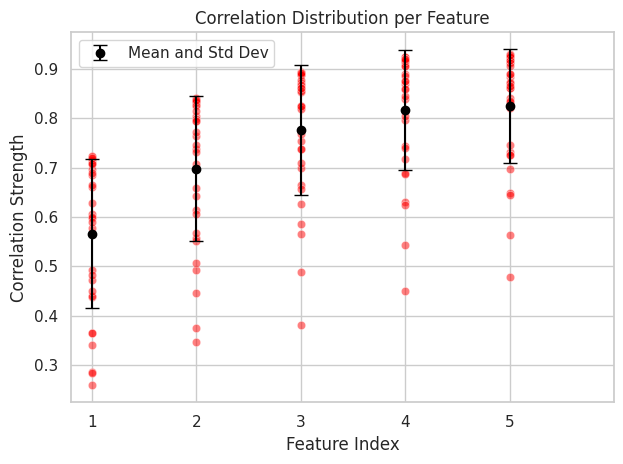

In [ ]:
plot_correlation_distribution(feature_correlation_matrix)

### Hilbert

In [ ]:
extracted_data_dict.keys()

dict_keys(['beta_binary_hilbert_only', 'beta_binary_signal', 'beta_binary_all_features', 'beta_binary_wavelet_included', 'beta_binary_hilbert_included', 'beta_binary_wavelet_only'])

(10, 5, 7500, 32)
(10, 5, 7500)


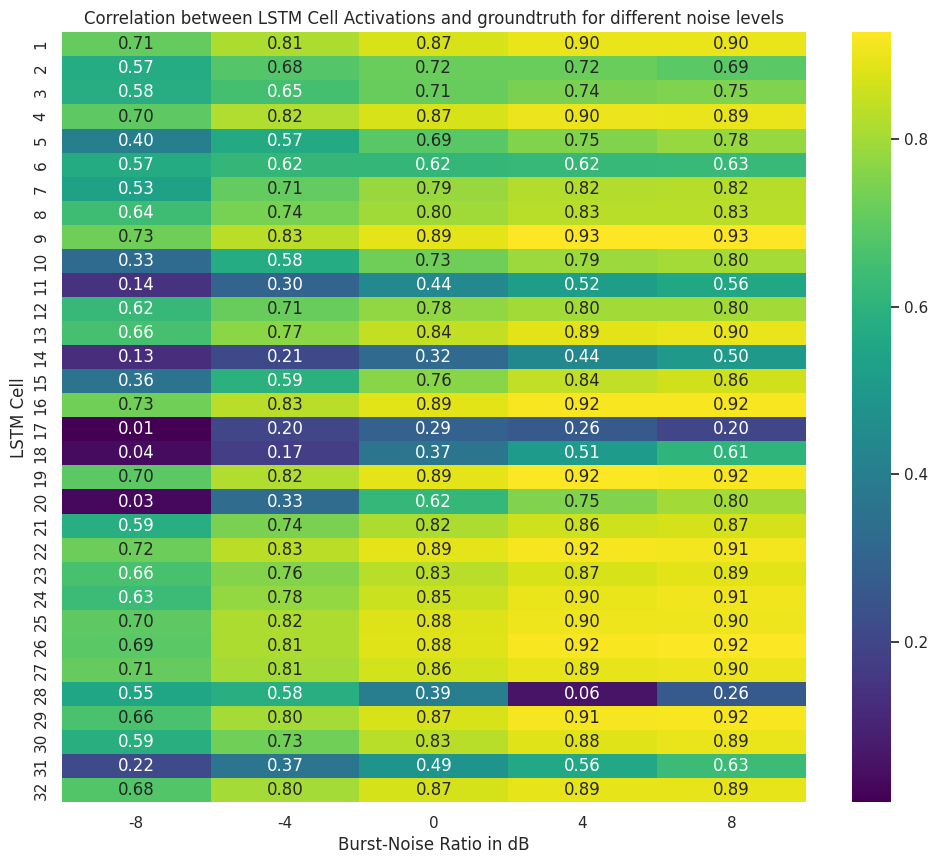

In [ ]:
model_name = "beta_binary_hilbert_included"

cell_activations_feature = extracted_data_dict[model_name]['hidden_states_activation'][-1]

y_labels_feature = tt_splits_dict[model_name]['y_test']

print(cell_activations_feature.shape)
print(y_labels_feature.shape)


hilbert_correlation_matrix = create_heatmap_cell_noise_corr(cell_activations_feature, y_labels_feature, absolute=True, rounding_factor=.2)


Model: beta_binary_hilbert_included 
Sample: 5
Number of Features: 2
Noise Ratios: 4
Visualizing Cells: [27, 8]


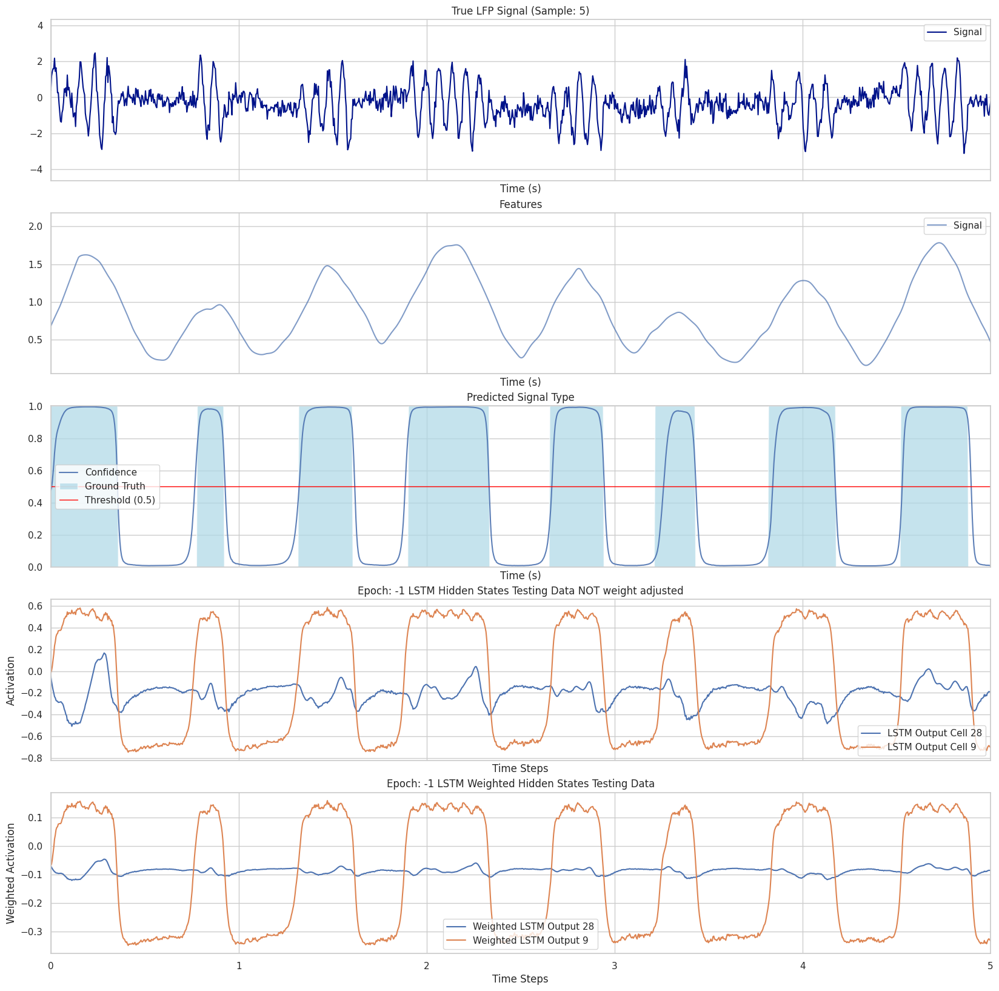

In [ ]:
special_cells = [27,8]
noise_ratio = 3
sample_id = 5

signal_only = tt_splits_dict[model_name]['X_test'][sample_id, noise_ratio, : , 0]

visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, signal_only, directory_name=model_name,
                                      sample_number=sample_id, epoch_to_visualize=-1,
                                      noise_ratio=noise_ratio,
                                      cells_to_visualize=special_cells,
                                      weighted_cells=True,
                                      feature_labels=feature_names[1:])

### Signal Only

(10, 5, 7500, 32)
(10, 5, 7500)


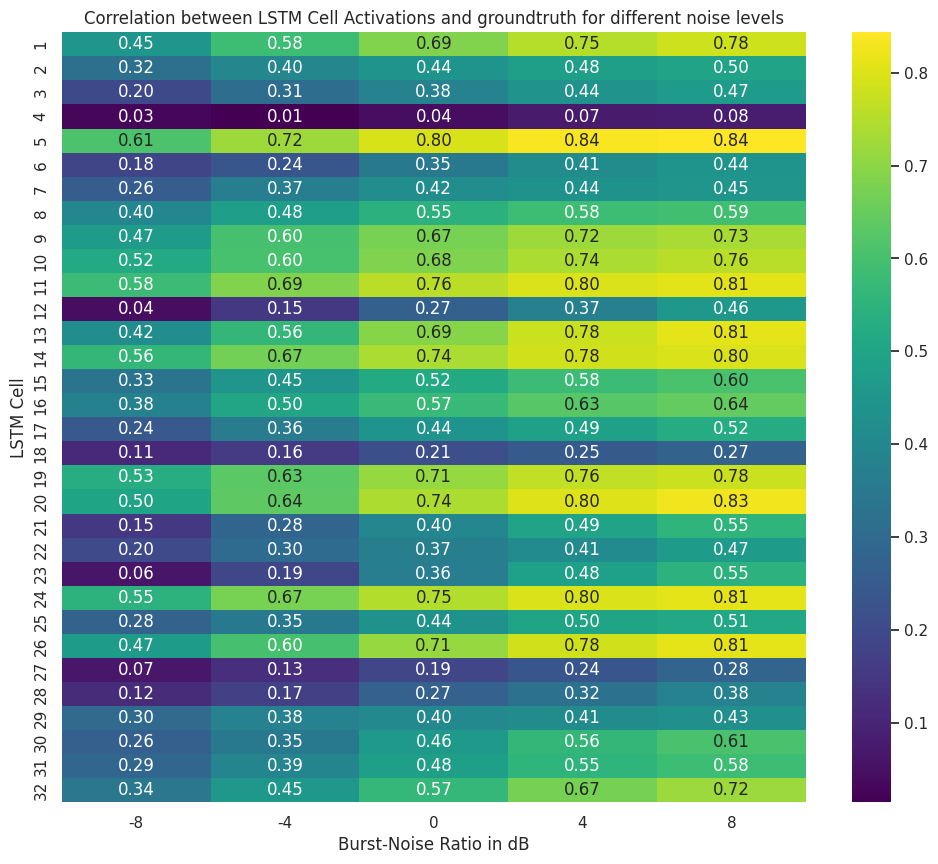

In [ ]:
model_name = "beta_binary_signal"

cell_activations_feature = extracted_data_dict[model_name]['hidden_states_activation'][-1]

y_labels_feature = tt_splits_dict[model_name]['y_test']

print(cell_activations_feature.shape)
print(y_labels_feature.shape)

signal_correlation_matrix = create_heatmap_cell_noise_corr(cell_activations_feature, y_labels_feature, absolute=True, rounding_factor=.2)


Model: mid_noise_beta_binary_signal 
Sample: 10
Number of Features: 1
Noise Ratios: 4
Visualizing Cells: [21, 11, 2]


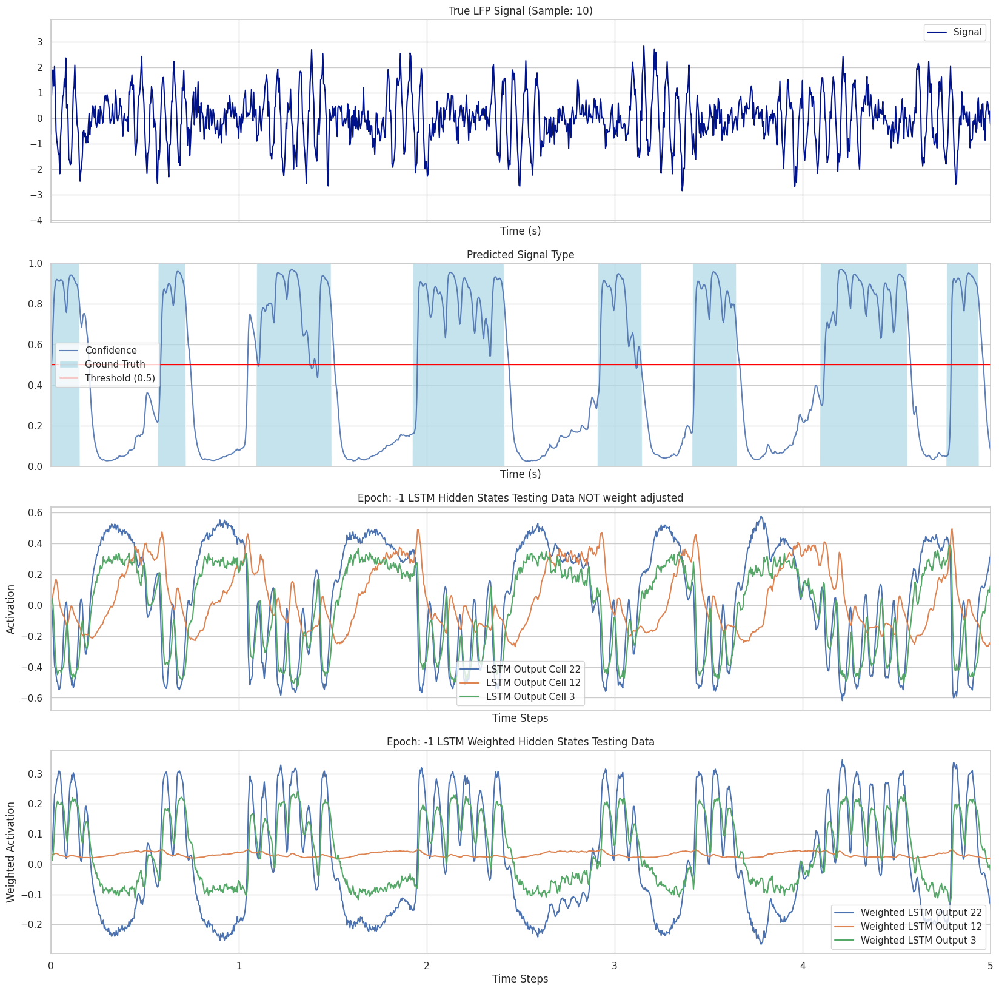

In [ ]:
special_cells = [21,11,2]
noise_ratio = 3
sample_id = 10

signal_only = tt_splits_dict['mid_noise_beta_binary_signal']['X_test'][sample_id, noise_ratio, : , 0]

visualize_hidden_activation_no_signal(extracted_data_dict, tt_splits_dict, signal_only, directory_name=model_name,
                                      sample_number=sample_id, epoch_to_visualize=-1,
                                      noise_ratio=noise_ratio,
                                      cells_to_visualize=special_cells,
                                      weighted_cells=True)

## Performance Analysis

Compare Predicted Results with Truth against Model and Noise

mid_noise_beta_binary_hibert_only:
   hidden_states_activation:
      Shape: (5, 15, 5, 7500, 32)
   epoch_model_predictions:
      Shape: (5, 15, 5, 7500, 1)
   final_hidden_states:
      Shape: (5, 15, 5, 32)
   final_cell_states:
      Shape: (5, 15, 5, 32)
   dense_weights:
      Shape: (5, 32, 1)
   dense_bias:
      Shape: (5, 1)


Structure of the train/test dictionary:
mid_noise_beta_binary_signal:
   X_test:
      Shape: (15, 5, 7500, 1)
   y_test:
      Shape: (15, 5, 7500)

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import matthews_corrcoef  # Import MCC function
from sklearn.metrics import accuracy_score

def create_heatmap_model_noise_accuracy(extracted_data_dict, tt_splits_dict, epoch=-1):
    """
    Creates a heatmap comparing model predictions with ground truth for different noise levels.

    Args:
        extracted_data_dict (dict): Dictionary containing extracted data from the models.
        tt_splits_dict (dict): Dictionary containing train-test splits.
        epoch (int, optional): The epoch to analyze. Defaults to -1 (last epoch).

    Returns:
        None: Displays the heatmap.
    """

    noise_levels = [-8, -4, 0, 4, 8]  # Assuming these are your noise levels
    model_label_names = ['Beta Signal Only', 'Beta Signal Only (Deep)', 'Beta Hilbert Amp Only', 'Beta Wavelet Only',
                         'Beta Hilbert Amp Included', 'Beta Wavelet Included',
                         'Beta All Features']
    index_list = [0,1,2,3,4,5,6]
    model_names = list(extracted_data_dict.keys())

    model_names = [model_names[i] for i in index_list]
    accuracy_matrix = []

    for model_name in model_names:
        model_accuracies = []
        for noise_ratio in range(len(noise_levels)):
            y_true = tt_splits_dict[model_name]['y_test'][:, noise_ratio, :].flatten()
            y_pred = extracted_data_dict[model_name]['model_predictions'][epoch][:, noise_ratio, :].flatten()
            y_pred_binary = np.rint(y_pred).astype(int)  # Convert predictions to binary
            mcc = matthews_corrcoef(y_true, y_pred_binary)  # Calculate MCC
            accuracy = accuracy_score(y_true, y_pred_binary)  # Calculate accuracy
            model_accuracies.append(mcc)
        accuracy_matrix.append(model_accuracies)

    # Create DataFrame for the heatmap
    df = pd.DataFrame(accuracy_matrix, index=model_label_names, columns=noise_levels)

    # Create the heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(df, annot=True, cmap="viridis", fmt=".2f", annot_kws={"size": 10})
    plt.title("Model MCC across Noise Levels")
    plt.xlabel("Noise Level (dB)")
    plt.ylabel("Model")
    plt.show()

In [ ]:
extracted_data_dict.keys()

dict_keys(['beta_binary_signal_deep', 'beta_binary_signal', 'beta_binary_hilbert_only', 'beta_binary_wavelet_only', 'beta_binary_hilbert_included', 'beta_binary_wavelet_included', 'beta_binary_all_features'])

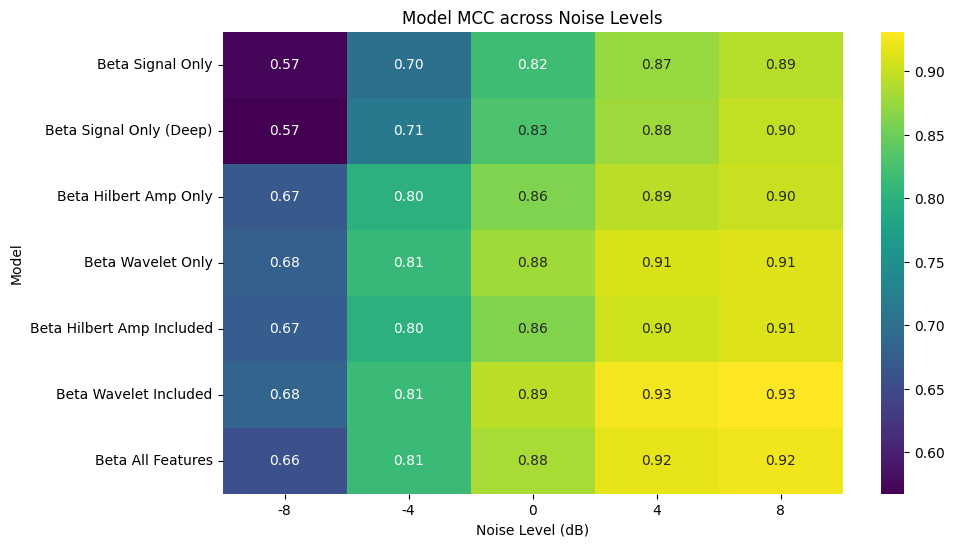

In [ ]:
create_heatmap_model_noise_accuracy(extracted_data_dict, tt_splits_dict)  # Use default last epoch (-1)


In [ ]:
extracted_data_dict.keys()

dict_keys(['beta_binary_hilbert_only', 'beta_binary_signal', 'beta_binary_all_features', 'beta_binary_wavelet_included', 'beta_binary_hilbert_included', 'beta_binary_wavelet_only'])

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import matthews_corrcoef  # Import MCC function
from sklearn.metrics import accuracy_score

def create_heatmap_model_freq_mcc(extracted_data_dict, tt_splits_dict, epoch=-1):
    """
    Creates heatmaps comparing model predictions with ground truth for different
    noise levels and frequencies, for all models in extracted_data_dict.

    Args:
        extracted_data_dict (dict): Dictionary containing extracted data from the models.
        tt_splits_dict (dict): Dictionary containing train-test splits.
        epoch (int, optional): The epoch to analyze. Defaults to -1 (last epoch).

    Returns:
        None: Displays the heatmaps for each model in a grid layout.
    """

    # Determine y-labels (frequencies)
    mean_freqs = np.logspace(np.log10(4), np.log10(100), num=20)
    mean_freqs_round = np.round(mean_freqs).astype(int)
    mean_freqs_round = [14, 16, 18, 22, 26]

    noise_levels = [-8, -4, 0, 4, 8]

    # Get model names from the extracted_data_dict
    model_names = list(extracted_data_dict.keys())

    # Generate model_label_names automatically from model_names
    model_label_names = [name.replace("beta_binary_", "").replace("_", " ").title() for name in model_names]

    num_models = len(model_names)  # Update to use actual model count

    # Calculate number of rows and columns for the grid
    num_cols = 3  # You can adjust this as needed
    num_rows = int(np.ceil(num_models / num_cols))

    # Create subplots in a grid layout with shared x and y axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(13 * num_cols // 2, 4 * num_rows),
                             sharex=True, sharey=True)

    # Calculate overall min and max values for consistent color scale
    all_values = []
    for model_name in model_names:
        accuracy_matrix = []
        for noise_ratio in range(len(noise_levels)):
            model_accuracies = []
            for frequency in range(len(mean_freqs_round)):
                y_true = tt_splits_dict[model_name]['y_test'][frequency, noise_ratio, :].flatten()
                y_pred = extracted_data_dict[model_name]['model_predictions'][epoch][frequency, noise_ratio, :]

                n_timesteps, n_cats = y_pred.shape

                y_pred_binary = np.rint(y_pred).astype(int)  # Convert predictions to binary

                mcc = matthews_corrcoef(y_true, y_pred_binary)  # Calculate MCC
                model_accuracies.append(mcc)
            accuracy_matrix.append(model_accuracies)
        all_values.extend(np.array(accuracy_matrix).flatten())  # Add all values to a single list

    vmin = min(all_values)
    vmax = max(all_values)

    # Loop through each model and its corresponding subplot in the grid
    for idx, (model_name, ax) in enumerate(zip(model_names, axes.flatten())):
        accuracy_matrix = []

        for noise_ratio in range(len(noise_levels)):
            model_accuracies = []
            for frequency in range(len(mean_freqs_round)):
                y_true = tt_splits_dict[model_name]['y_test'][frequency, noise_ratio, :].flatten()
                y_pred = extracted_data_dict[model_name]['model_predictions'][epoch][frequency, noise_ratio, :]

                n_timesteps, n_cats = y_pred.shape

                y_pred_binary = np.rint(y_pred).astype(int)  # Convert predictions to binary

                mcc = matthews_corrcoef(y_true, y_pred_binary)  # Calculate MCC
                model_accuracies.append(mcc)
            accuracy_matrix.append(model_accuracies)

        # Create DataFrame for the heatmap for the current model
        df = pd.DataFrame(accuracy_matrix, index=noise_levels, columns=mean_freqs_round)

        # Create the heatmap on the current subplot with consistent color scale
        sns.heatmap(df, annot=True, cmap="viridis", fmt=".2f", annot_kws={"size": 10},
                    ax=ax, vmin=vmin, vmax=vmax)
        ax.set_title(f"Model Accuracy (MCC) - {model_label_names[idx]}")  # Use extended labels
        ax.set_ylabel("Noise Ratios in dB")

    # Common X-label for the entire plot
    fig.text(0.5, 0.04, "Frequency in Hz", ha='center', va='center')  # X-label below the grid

    # Remove any extra empty subplots
    for i in range(num_models, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

    plt.tight_layout(rect=[0, 0.05, 1, 1])  # Adjust layout for common x-label
    plt.show()

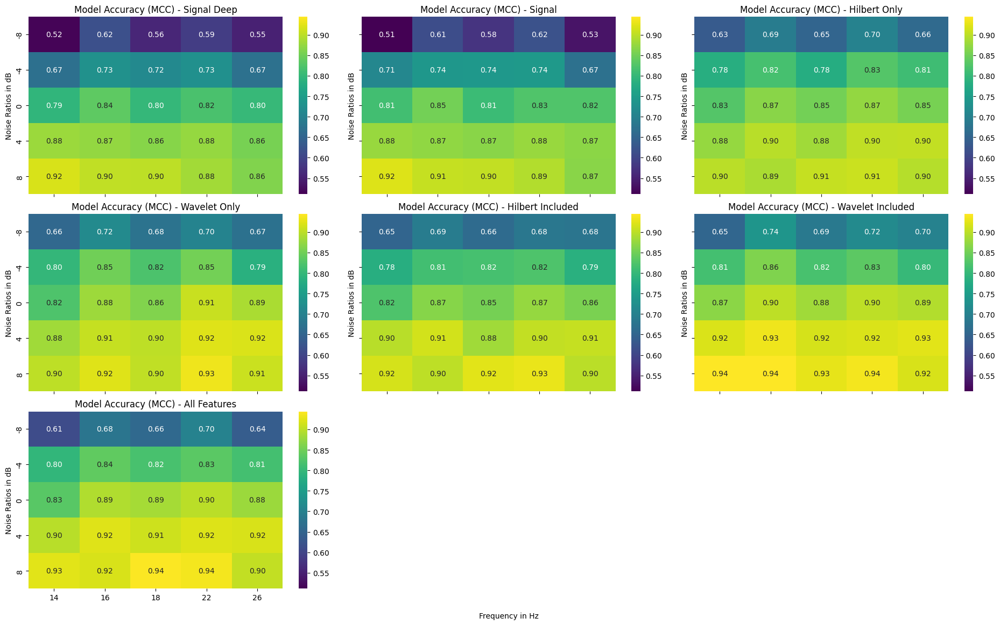

In [ ]:
create_heatmap_model_freq_mcc(extracted_data_dict, tt_splits_dict, epoch=-1)  # Use default last epoch (-1)


# Take-aways:

- Hidden state is available for each timestep and is used for predictions. It contains information about the input sequence up to that point, including any information carried by the cell state.
- Cell state accumulates over the sequence and is only returned as a final value at the end of the sequence.

**1. Hidden State (h_t)**

- The hidden state is a representation of the information the LSTM has learned up to that point in time, including its memory of past timesteps and current input.
The hidden state is calculated at every timestep of the sequence. This means that every time the LSTM processes a new timestep of the input sequence, it updates the hidden state based on both the previous hidden state and the current input.
- The output of the LSTM (when return_sequences=True) corresponds to the hidden state at each timestep of the sequence. This is the "active" memory of the network, and it's used to make predictions, process future timesteps, and propagate information throughout the sequence.

**2. Cell State (c_t):**

- The cell state is like the "long-term memory" of the LSTM. It carries information throughout the sequence, but it is not updated at every timestep in the same way as the hidden state. Instead, it is updated through a combination of gates (input, forget, and output gates) at each timestep, but it only gets the final value after the sequence ends.
- The cell state is updated at every timestep, but its final value at the end of the sequence is the long-term memory that has been passed from one timestep to the next.

Note: The cell state is typically not returned as an output for every timestep, because it's primarily used as a form of internal memory to pass information between timesteps. It's not directly used for prediction — it's the hidden state that contains the key information used for outputs and predictions.

**3. How the LSTM Works Internally:**

At each timestep 𝑡, the LSTM updates the hidden state (h_t) and the cell state (c_t) using the following operations:

- Forget Gate: Decides what proportion of the previous cell state to "forget."
- Input Gate: Determines how much new information to add to the cell state.
- Output Gate: Decides what the current hidden state should be, based on the cell state and current input.

**4. Final**

- The cell state is essentially the memory that is propagated through the network as the sequence progresses, and it's not directly used for making predictions at each timestep (it’s used internally for learning).
- The final cell state at the end of the sequence is returned because it represents the accumulated memory after the whole sequence has been processed.
